# [SF-DST] Car Price Prediction

## Прогнозирование стоимости автомобиля по характеристикам

### Работа Калашникова Сергея

<a id="0"></a>
###  СОДЕРЖАНИЕ

1.  [Билиотеки, функции, настройки](#1)  
     1.1 [Билиотеки](#1.1)  
     1.2 [функции](#1.2)  
     1.3 [Настройки](#1.3)  
2.  [Загрузка и предварительный осмотр данных, парсинг](#2)  
     2.1 [Парсинг](#2.1)  
3.  [Разведочный анализ данных и базовая очистка данных](#3)   
     3.1 [Унификация признаков](#3.1)  
     3.2 [Очистка даных](#3.2)  
     3.3 [Дубликаты](#3.3)  
     3.4 [Обработка пропусков](#3.4)  
     3.5 [Детальный анализ признаков](#3.5)  
     3.6 [Генерация новых признаков](#3.6)  
     3.7 [Обработка выбросов](#3.7)  
     3.8 [Отбор признаков для моделирования](#3.8)    
     3.9 [Препроцессинг перед моделированием](#3.9)  
4.  [Предварительный анализ ML](#4)
5.  [Модель №1: Наивная модель](#5)
6.  [Модель №2: CatBoost](#6)
7.  [Модель №3: RandomForestRegressor](#7)
8.  [Модель №4: XGBRegressor](#8)
9.  [Модель №5: ExtraTreesRegressor](#9)
10. [Модель №6: BaggingRegressor](#10)
11. [Модель №7: StackingRegressor](#11)
12. [Выбор модели](#12)
13. [Submision](#13)
14. [Выводы](#14)

<a id="1"></a>
# [1. Билиотеки, функции, классы](#0)

<a id="1.1"></a>
## 1.1 Билиотеки

In [1]:
import sys


In [2]:
import numpy as np
import pandas as pd
import sys
import re
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import time
import xgboost as xgb

from pandas_profiling import ProfileReport
from scipy.stats import ttest_ind
from itertools import combinations
from tqdm.notebook import tqdm
from catboost import CatBoostRegressor

from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split, KFold, RandomizedSearchCV
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler, RobustScaler, MinMaxScaler
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_selection import f_regression, mutual_info_regression
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, BaggingRegressor
from sklearn.ensemble import StackingRegressor

%matplotlib inline
warnings.simplefilter('ignore')
sns.set()

In [296]:
!pip freeze > requirements.txt
RANDOM_SEED = 42

<a id="1.2"></a>
## 1.2 Функции

In [4]:
# Функция для получения и сохранения в отдельный файл ссылок на объявления

def collect_car_urls(brand: str):
    main_url = f'https://auto.ru/cars/{brand}/all/'   
    main_response = requests.get(main_url)   
    main_soap = BeautifulSoup(main_response.content.decode('utf-8'), 'html.parser')    
    _ = main_soap.find('span', class_='ButtonWithLoader__content').text.replace(u'\xa0', '')
    urls_total = int(re.findall(r'\d+', _)[0])
    ads_per_page = len(main_soap.find_all('a', class_='Link ListingItemTitle__link'))
    pages_num = urls_total // ads_per_page
    
    all_urls = []
    
    for page_num in range(1, pages_num):
        if page_num % 20 == 0:
            print(f"Extracting page {page_num} from {pages_num}...")
        page_url = f'{main_url}?page={page_num}'   
        page_response = requests.get(page_url)
        time.sleep(0.01)
        page_soap = BeautifulSoup(page_response.content.decode('utf-8'), 'html.parser')   
        
        all_urls.extend([a.get('href') for a in page_soap.find_all('a', class_='Link ListingItemTitle__link')])

    return all_urls

In [5]:
# Функция для получения и сохранения данных из объявления

def extract_url_data(url: str, extracted_columns: list):

    response = requests.get(url)
    page = BeautifulSoup(response.content.decode('utf-8'), 'html.parser')
    
    try:
        catalog_url = page.find(
            'a', class_='Link SpoilerLink CardCatalogLink SpoilerLink_type_default').get('href')
        response_catalog = requests.get(catalog_url)
        page_catalog = BeautifulSoup(response_catalog.content.decode('utf-8'), 'html.parser')
    except:
        pass
    try:
        json_data_catalog = json.loads(
            page_catalog.find('script', type="application/json", id='initial-state').string)
    except:
        pass
    try:
        json_data_equip = json.loads(
            page.find('script', type="application/json", id='initial-state').string)
    except:
        pass
    try:
        data = json.loads(
            page.find('script', type="application/ld+json").string)
        data = flatten(data)
    except:
        pass
    
    try:
        data['complectation_dict'] = [
        k for k, v in json_data_catalog['state']['compare']['selected'][0]['options'].items() if v == 1]
    except:
        pass
    try:
        data['equipment_dict'] = json_data_equip['card']['vehicle_info']['equipment']
    except:
        pass
    try:
        mileage = page.find(
            'li', class_='CardInfoRow CardInfoRow_kmAge').find_all('span')[-1].text.replace(u'\xa0', u'')
        data['mileage'] = int(re.findall(r'\d+', mileage)[0])
    except:
        pass
    try:
        data['model_name'] = page.find_all(
        'div', class_='InfoPopup InfoPopup_theme_plain InfoPopup_withChildren BreadcrumbsPopup')[1].text
    except:
        pass
    try:
        data['parsing_unixtime'] = int(time.time())
    except:
        pass
    try:
        data['sell_id'] = int(re.findall(
            r'\d+', page.find('div', class_='CardHead__infoItem CardHead__id').text)[0])
    except:
        pass
    try:
        data['super_gen'] = json.loads(
            page.find('div', id="sale-data-attributes").get('data-bem'))
    except:
        pass
    try:
        data['Владельцы'] = page.find(
            'li', class_='CardInfoRow CardInfoRow_ownersCount').find_all('span')[-1].text.replace(u'\xa0', u' ')
    except:
        pass
    try:
        data['Владение'] = page.find(
            'li', class_='CardInfoRow CardInfoRow_owningTime').find_all('span')[-1].text
    except:
        pass
    try:
        data['ПТС'] = page.find(
            'li', class_='CardInfoRow CardInfoRow_pts').find_all('span')[-1].text
    except:
        pass
    try:
        data['Привод'] = page.find(
            'li', class_='CardInfoRow CardInfoRow_drive').find_all('span')[-1].text
    except:
        pass
    try:
        data['Руль'] = page.find('li', class_='CardInfoRow CardInfoRow_wheel').find_all('span')[-1].text
    except:
        pass
    try:
        data['Состояние'] = page.find(
            'li', class_='CardInfoRow CardInfoRow_state').find_all('span')[-1].text
    except:
        pass
    try:
        data['Таможня'] = page.find(
            'li', class_='CardInfoRow CardInfoRow_customs').find_all('span')[-1].text
    except:
        pass
    try:
        data['description'] = re.sub('\W+', ' ', data['description'])
    except:
        pass
    
    # additional features
    try:
        data['views'] =  page.find(
            'div', class_='CardHead__infoItem CardHead__views').text.split()[0]
    except:
        pass
    try:
        data['date_added'] = page.find(
            'div', class_='CardHead__infoItem CardHead__creationDate').text 
    except:
        pass
    try:
        data['region'] = page.find(
            'div', class_='CardBreadcrumbs').find_all(
            'div', class_='CardBreadcrumbs__item')[-1].text.replace(u'\xa0', u' ')
    except:
        pass
    
    output = []
    try:
        for col in extracted_columns:
            output.append(data.get(col, None))    
    except:
        pass
    if not output:
        output = [None] * len(extracted_columns)
    return output

In [6]:
# возвращает метрику MAPE. На вход получает массив реальных и предсказанных значений y.
def mape(y_true, y_pred):
    return np.mean(np.abs((y_pred-y_true)/y_true))

In [7]:
# Функция, которая принимает на вход количество месяцев, а возвращает строку в формате "x  месяц(-а -ев)"
def months_to_sent(months):
    if months == 1:
        return f'{months} месяц'
    elif 2 <= months <= 4:
        return f'{months} месяца'
    return f'{months} месяцев'

# Функция, которая принимает на вход количество лет, а возвращает строку в формате "x  лет/год/года"
def years_to_sent(years):
    if 11 <= years <= 14 or 5 <= years % 10 <= 9 or years % 10 == 0:
        return f'{years} лет'
    elif years % 10 == 1:
        return f'{years} год'
    elif 2 <= years % 10 <= 4:
        return f'{years} годa'

# Функция, которая приводит содержимое ячейки "Владение" в train к тому же виду, как в test.
# возвращает вместо словаря информацию в виде "x лет y месяцев"
def tenure(row):
    row = re.findall('\d+', str(row))  # находим все целые числа в строке
    if row != []:
        years = 2020 - (int(row[0])+1)  # 2020, т.к. данные собраны в 2020 году
        months = 2 + (12 - int(row[1]))
        if years < 0:
            return months_to_sent(int(row[1]))
        elif years == 0 and months < 12:
            return months_to_sent(months)
        elif years >= 0 and months == 12:
            return years_to_sent(years + 1)
        elif years >= 0 and months > 12:
            return years_to_sent(years + 1)+' и '+months_to_sent(months - 12)
        elif years > 0 and months < 12:
            return years_to_sent(years)+' и '+months_to_sent(months)
        return None

In [8]:
#  Функция перевеодит формат данных "y yyy км" в количество км.
def num_of_km(row):

    if pd.notnull(row):
        list_km = row.split(' ')
        if len(list_km) == 2:  
            if list_km[1] in ['км']:
                return int(list_km[0])
        return int(list_km[0]+list_km[1])  

In [9]:
# Функция, которая принимает строку, содержащую информацию про объеме двигателя 

def convert_engineDisplacement_to_float(row):
    row = str(row)
    volume = re.findall('\d\.\d', row)
    if volume == []:
        return None
    return float(volume[0])

In [10]:
# Функция принимает на вход датафрейм, а также заданный порог % пустых значений, который хотим обработать. 
# На выход выводит на экран информацию о сумме пустых значений для всех колонок, а также процеtn

def intitial_eda_checks(df, missing_percent):
    if df.isnull().sum().sum() > 0:
        mask_total = df.isnull().sum().sort_values(ascending=False)
        total = mask_total[mask_total > 0]

        mask_percent = df.isnull().mean().sort_values(ascending=False)
        percent = mask_percent[mask_percent > 0]

        series = mask_percent[mask_percent > missing_percent]
        columns = series.index.to_list()

        missing_data = pd.DataFrame(pd.concat(
            [total, round(percent*100, 2)], axis=1, keys=['Количество', '%']))
        print('Сумма и процент значений NaN:\n \n')
        display(missing_data)
    else:
        print('NaN значения не найдены.')

In [11]:
# Функция перевеодит формат данных "x лет y месяца(ев)" в количество месяцев.
def num_of_months(row):
    if pd.notnull(row) and row != 'no_data':
        list_ownership = row.split()  # разделяем строку на список из месяца и лет
        if len(list_ownership) == 2:  # если содержится информация только про годы
            if list_ownership[1] in ['год', 'года', 'лет']:
                return int(list_ownership[0])*12
            return int(list_ownership[0])  # переводим год в месяцы
        return int(list_ownership[0])*12 + int(list_ownership[3])

In [12]:
# Функция для отрисовки коробочной диаграммы для нечисловых признаков.
def get_boxplot(column):
    fig, ax = plt.subplots(figsize=(25, 5))
    plt.subplots_adjust(wspace=0.5)
    sns.boxplot(x=column, y='price',
                data=data[data['train'] == 1],
                ax=ax)
    plt.xticks(rotation=45)

    ax.set_ylim(0, (data.price.quantile(0.75) + 8 *
                    (data.price.quantile(0.75) - data.price.quantile(0.25))))
    ax.set_title('Boxplot для ' + column)
    plt.show()

In [13]:
# Функция для анализа категориального признака.
def analyze_cat_cols(col):
 

    fig, axes = plt.subplots(figsize=(25, 5))
    # среднее значение количества объявлений по всем категориям признака
    mean = data[col].value_counts().values.mean()
    x = data[col].unique()
    # Построим графики по признаку и для среднего
    sns.histplot(data=data, x=data[col],
                 stat='count', bins=data[col].nunique())
    axes.plot(x, [mean for i in x], '--', color='r')
    plt.xticks(rotation=45)
    plt.title('Распределение количества объясвлений по '+col)
    plt.show()
    

    get_boxplot(col)

In [14]:
# Функция пересчета км пробега автомобиля в год. 
def km_per_year(row):
    if row['mileage'] != 0:
        if row['parsing_date'].year - row['productionDate'] == 0:
            return row['mileage']
        else:
            return row['mileage']/(row['parsing_date'].year - row['productionDate'])
    return 0  

In [15]:
# Функция для создания столбца с информацией, старше ли авто, чем year_lim.
def prod_date_range(row, year_lim):
    if (row['parsing_date'].year-row['productionDate']) >= year_lim:
        return 1
    return 0

In [16]:
# Функция выводит инфорамцию о границах выборосов для признака.
def iqr_analysis(series, mode=False):
    IQR = series.quantile(0.75) - series.quantile(0.25)
    perc25 = series.quantile(0.25)
    perc75 = series.quantile(0.75)

    f = perc25 - 1.5*IQR
    l = perc75 + 1.5*IQR

    if mode:
        return f, l

    print(
        "\n25-й перцентиль: {},".format(perc25),
        "\n75-й перцентиль: {},".format(perc75),
        "\nIQR: {}, ".format(IQR),
        "\nГраницы выбросов: [{f}, {l}].".format(
            f=perc25 - 1.5*IQR, l=perc75 + 1.5*IQR),
        "\n\nМинимальное значение признака: {}.".format(series.min()),
        "\nМаксимальное значение признака: {} .\n".format(series.max()))

    if series.min() < f:
        print("Найдены выбросы по нижней границе признака! Количество: {}, {}%".format(series.where(
            series < f).count(), round(series.where(series < f).count()/series.count()*100, 2)))
    if series.max() > l:
        print("Найдены выбросы по верхней границе признака! Количество: {}, {}%".format(series.where(
            series > l).count(), round(series.where(series > l).count()/series.count()*100, 2)))

In [17]:
# Функция поиска статистически значимых различий для колонки с помощью теста Стьюдента.
def get_stat_dif(column):
    cols = data.loc[:, column].value_counts().index[:]
    combinations_all = list(combinations(cols, 2))

    tmp = data[data['train'] == 1]

    for comb in combinations_all:
        if ttest_ind(tmp.loc[data[data['train'] == 1].loc[:, column] == comb[0], 'price'],
                     tmp.loc[data[data['train'] == 1].loc[:, column] == comb[1], 'price']).pvalue <= 0.05/len(combinations_all):  # учли поправку Бонферони
            pass
        else:
            print(
                'Не найдены статистически значимые различия для колонки и комбинации', column, comb)
            return column
            break

<a id="1.3"></a>
## [1.3 Настройки](#0)

In [18]:
# DIR_TRAIN = '../input/parsing-all-moscow-auto-ru-09-09-2020/'
# DIR_TRAIN_NEW = '../input/autorucars/'
# DIR_TEST = '../input/sf-dst-car-price-prediction/'
VAL_SIZE = 0.20   # 20%

<a id="2"></a>
# [2. Загрузка и предварительный осмотр данных, парсинг](#0)

## Загрузка данных

In [19]:
train = pd.read_csv('all_auto_ru_09_09_2020.csv')
test = pd.read_csv('test.csv')
sample_submission = pd.read_csv('sample_submission.csv')

In [20]:
train.head()

,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,vehicleTransmission,...,Руль,Состояние,Владельцы,ПТС,Таможня,Владение,price,start_date,hidden,model
0,Седан,AUDI,040001,бензин,1990.0,2.8 MT (174 л.с.) 4WD,4.0,1991,SEDAN MECHANICAL 2.8,MECHANICAL,...,LEFT,NaN,3.0,ORIGINAL,True,NaN,200000.0,2019-10-03T08:09:11Z,NaN,100
1,Седан,AUDI,EE1D19,бензин,1982.0,1.8 MT (90 л.с.),4.0,1986,SEDAN MECHANICAL 1.8,MECHANICAL,...,LEFT,NaN,3.0,ORIGINAL,True,NaN,60000.0,2020-09-06T06:49:40Z,NaN,100
2,Универсал 5 дв.,AUDI,0000CC,бензин,1988.0,2.3 MT (136 л.с.) 4WD,5.0,1989,WAGON_5_DOORS MECHANICAL 2.3,MECHANICAL,...,LEFT,NaN,3.0,ORIGINAL,True,NaN,99000.0,2020-09-02T14:04:21Z,NaN,100
3,Седан,AUDI,CACECB,бензин,1988.0,1.8 MT (90 л.с.),4.0,1989,SEDAN MECHANICAL 1.8,MECHANICAL,...,LEFT,NaN,3.0,ORIGINAL,True,NaN,65000.0,2020-08-23T17:40:09Z,NaN,100
4,Седан,AUDI,040001,бензин,1990.0,2.0 MT (101 л.с.),4.0,1991,SEDAN MECHANICAL 2.0,MECHANICAL,...,LEFT,NaN,3.0,DUPLICATE,True,NaN,100000.0,2020-09-08T09:22:07Z,NaN,100


In [21]:
test.head()

,bodyType,brand,car_url,color,complectation_dict,description,engineDisplacement,enginePower,equipment_dict,fuelType,...,vehicleConfiguration,vehicleTransmission,vendor,Владельцы,Владение,ПТС,Привод,Руль,Состояние,Таможня
0,лифтбек,SKODA,https://auto.ru/cars/used/sale/skoda/octavia/1...,синий,NaN,"Все автомобили, представленные в продаже, прох...",1.2 LTR,105 N12,"{""engine-proof"":true,""tinted-glass"":true,""airb...",бензин,...,LIFTBACK ROBOT 1.2,роботизированная,EUROPEAN,3 или более,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен
1,лифтбек,SKODA,https://auto.ru/cars/used/sale/skoda/octavia/1...,чёрный,NaN,ЛОТ: 01217195\nАвтопрага Север\nДанный автомоб...,1.6 LTR,110 N12,"{""cruise-control"":true,""asr"":true,""esp"":true,""...",бензин,...,LIFTBACK MECHANICAL 1.6,механическая,EUROPEAN,1 владелец,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен
2,лифтбек,SKODA,https://auto.ru/cars/used/sale/skoda/superb/11...,серый,"{""id"":""20026336"",""name"":""Ambition"",""available_...","Все автомобили, представленные в продаже, прох...",1.8 LTR,152 N12,"{""cruise-control"":true,""tinted-glass"":true,""es...",бензин,...,LIFTBACK ROBOT 1.8,роботизированная,EUROPEAN,1 владелец,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен
3,лифтбек,SKODA,https://auto.ru/cars/used/sale/skoda/octavia/1...,коричневый,"{""id"":""20803582"",""name"":""Ambition"",""available_...",КОМПЛЕКТ ЗИМНЕЙ (ЛЕТНЕЙ) РЕЗИНЫ ПО СЕЗОНУ В ПО...,1.6 LTR,110 N12,"{""cruise-control"":true,""roller-blind-for-rear-...",бензин,...,LIFTBACK AUTOMATIC 1.6,автоматическая,EUROPEAN,1 владелец,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен
4,лифтбек,SKODA,https://auto.ru/cars/used/sale/skoda/octavia/1...,белый,NaN,ЛОТ: 01220889\nАвтопрага Север\n\nВы можете по...,1.8 LTR,152 N12,"{""cruise-control"":true,""asr"":true,""esp"":true,""...",бензин,...,LIFTBACK AUTOMATIC 1.8,автоматическая,EUROPEAN,1 владелец,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен


In [22]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89378 entries, 0 to 89377
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   bodyType              89377 non-null  object 
 1   brand                 89378 non-null  object 
 2   color                 89378 non-null  object 
 3   fuelType              89378 non-null  object 
 4   modelDate             89377 non-null  float64
 5   name                  89377 non-null  object 
 6   numberOfDoors         89377 non-null  float64
 7   productionDate        89378 non-null  int64  
 8   vehicleConfiguration  89377 non-null  object 
 9   vehicleTransmission   89377 non-null  object 
 10  engineDisplacement    89377 non-null  object 
 11  enginePower           89377 non-null  float64
 12  description           86124 non-null  object 
 13  mileage               89378 non-null  int64  
 14  Комплектация          89378 non-null  object 
 15  Привод             

In [23]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34686 entries, 0 to 34685
Data columns (total 32 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   bodyType              34686 non-null  object
 1   brand                 34686 non-null  object
 2   car_url               34686 non-null  object
 3   color                 34686 non-null  object
 4   complectation_dict    6418 non-null   object
 5   description           34686 non-null  object
 6   engineDisplacement    34686 non-null  object
 7   enginePower           34686 non-null  object
 8   equipment_dict        24690 non-null  object
 9   fuelType              34686 non-null  object
 10  image                 34686 non-null  object
 11  mileage               34686 non-null  int64 
 12  modelDate             34686 non-null  int64 
 13  model_info            34686 non-null  object
 14  model_name            34686 non-null  object
 15  name                  34686 non-null

<a id="2.1"></a>
## [Парсинг](#0)


### Подготовка к парсингу
Посмотрим на список колонок, которые есть в test, но нет в подключенном train.

In [24]:
# Список колонок, которых нет в train
dif_list = list(set(test.columns).difference(train.columns))
print("Список колонок, которых нет в train, но есть в test:", dif_list)

# Посмотрим на данные в этих колонках
test[dif_list].sample(3)

Список колонок, которых нет в train, но есть в test: ['model_info', 'equipment_dict', 'car_url', 'sell_id', 'complectation_dict', 'vendor', 'priceCurrency', 'super_gen', 'parsing_unixtime', 'model_name', 'image']


,model_info,equipment_dict,car_url,sell_id,complectation_dict,vendor,priceCurrency,super_gen,parsing_unixtime,model_name,image
22548,"{""code"":""LS"",""name"":""LS"",""ru_name"":""LS"",""morph...","{""asr"":true,""roller-blind-for-rear-window"":tru...",https://auto.ru/cars/used/sale/lexus/ls/109575...,1095752030,"{""id"":""21205720"",""name"":""Premium 2"",""available...",JAPANESE,RUB,"{""id"":""21120712"",""name"":""500"",""nameplate"":""500...",1603299772,LS,https://autoru.naydex.net/imflT9272/520f62I9/2...
10077,"{""code"":""X3"",""name"":""X3"",""ru_name"":""Х3"",""morph...","{""start-stop-function"":true,""esp"":true,""airbag...",https://auto.ru/cars/used/sale/bmw/x3/10987568...,1098756876,"{""id"":""6509401"",""name"":""xDrive28i"",""available_...",EUROPEAN,RUB,"{""id"":""7957949"",""name"":""28i"",""nameplate"":""28i ...",1603117674,X3,https://avatars.mds.yandex.net/get-autoru-vos/...
18490,"{""code"":""G_KLASSE"",""name"":""G-Класс"",""ru_name"":...",NaN,https://auto.ru/cars/used/sale/mercedes/g_klas...,1095877446,NaN,EUROPEAN,RUB,"{""id"":""20891791"",""name"":""320"",""nameplate"":""320...",1603251852,G_KLASSE,https://avatars.mds.yandex.net/get-autoru-vos/...


In [25]:
# Посмотрим на колическтво уникальных значений
for item in dif_list:
    print(item, test[item].nunique())

model_info 954
equipment_dict 23705
car_url 34686
sell_id 34686
complectation_dict 2364
vendor 2
priceCurrency 1
super_gen 5890
parsing_unixtime 34686
model_name 544
image 34557


На этом этапе ссылки на объявления собирались по 12 маркам автомобилей, имеющимся в тестовом датасете.

In [26]:
# brands = [brand.lower() for brand in test_df.brand.unique()]
# brands

In [27]:
# urls = []
# for brand in brands:
#     print(f"Extracting data for the brand {brand}:")
#     all_urls = collect_car_urls(brand)
#     urls.extend(all_urls)

In [28]:
# train_df = pd.DataFrame({'car_url': urls})
# train_df.to_csv('train_df.csv', index=False)

In [29]:
# train_df.info()

In [30]:
# extracted_columns = test_df.columns.to_list()

In [31]:
# final_df = df_combined

In [32]:
# final_list = []
# for n, url in enumerate(df_combined.car_url.values.tolist()):
#     if n % 50 == 0:
#         print(f"The # of current processing URL is {n}, url is {url}.")
#     if n % 1000 == 0:
#         print(f"Create a dataframe from the list and concetenate it with the already collected data.")
#         df1 = pd.DataFrame(data=final_list, columns=extracted_columns + ['views', 'date_added', 'region', 'price'])
#         final_df = pd.concat([final_df, df1], ignore_index=True)
#         final_df.to_csv('all_car11.csv', index=False)
#         final_list = []
#     final_list.append(extract_url_data(url, extracted_columns + ['views', 'date_added', 'region', 'price']))

Получен список со ссылками на 137685 объявлений по выбранным маркам автомобилей

In [33]:
# Добавим датафрейм с новыми данными Jupyter
train_new = pd.read_csv('all_car11.csv', sep=",")

In [34]:
train_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137685 entries, 0 to 137684
Data columns (total 35 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            137685 non-null  int64  
 1   car_url               137685 non-null  object 
 2   bodyType              137685 non-null  object 
 3   brand                 137685 non-null  object 
 4   color                 137685 non-null  object 
 5   complectation_dict    137685 non-null  object 
 6   description           137685 non-null  object 
 7   engineDisplacement    137685 non-null  object 
 8   enginePower           137685 non-null  object 
 9   equipment_dict        137685 non-null  object 
 10  fuelType              137685 non-null  object 
 11  image                 137616 non-null  object 
 12  mileage               105817 non-null  object 
 13  modelDate             137685 non-null  int64  
 14  model_name            105817 non-null  object 
 15  

In [35]:
train_new.head()

,Unnamed: 0,car_url,bodyType,brand,color,complectation_dict,description,engineDisplacement,enginePower,equipment_dict,...,vehicleConfiguration,vehicleTransmission,Владельцы,Владение,ПТС,Привод,Руль,Состояние,Таможня,region
0,0,https://auto.ru/cars/used/sale/skoda/fabia/110...,хэтчбек 5 дв.,SKODA,серебристый,"['heated-wash-system', 'airbag-passenger', 'lo...",Один хозяин Выпуск По ПТС 2012 года покупка с ...,1.4 LTR,86 N12,"{'condition': True, 'bluetooth': True, 'aux': ...",...,HATCHBACK_5_DOORS MECHANICAL 1.4,механическая,1 владелец,8 лет и 9 месяцев,Оригинал,передний,Левый,Не требует ремонта,Растаможен,в Екатеринбурге
1,1,https://auto.ru/cars/used/sale/skoda/octavia/1...,лифтбек,SKODA,чёрный,[],Авто в хорошем состоянии В этом году производи...,1.4 LTR,75 N12,"{'condition': True, 'dark-interior': True, 'fa...",...,LIFTBACK MECHANICAL 1.4,механическая,3 или более,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен,в Нижнегорском
2,2,https://auto.ru/cars/used/sale/skoda/kodiaq/11...,внедорожник 5 дв.,SKODA,бежевый,"['cruise-control', 'multi-wheel', 'heated-wash...",Комплект зимних шин Nokian Hakka 8 в подарок С...,2.0 LTR,150 N12,"{'automatic-lighting-control': True, 'seats-5'...",...,ALLROAD_5_DOORS ROBOT 2.0,роботизированная,1 владелец,1 год и 2 месяца,Оригинал,полный,Левый,Не требует ремонта,Растаможен,в Санкт-Петербурге
3,3,https://auto.ru/cars/new/group/skoda/kodiaq/20...,внедорожник 5 дв.,SKODA,белый,"['cruise-control', 'multi-wheel', 'heated-wash...",В стоимость автомобиля включено дополнительное...,2.0 LTR,180 N12,"{'cruise-control': True, 'asr': True, 'esp': T...",...,ALLROAD_5_DOORS ROBOT 2.0,роботизированная,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,https://auto.ru/cars/used/sale/skoda/fabia/110...,хэтчбек 5 дв.,SKODA,бежевый,"['heated-wash-system', 'airbag-passenger', 'lo...",Один собственник Сделана полная предпродажная...,1.6 LTR,105 N12,"{'engine-proof': True, 'esp': True, 'airbag-dr...",...,HATCHBACK_5_DOORS MECHANICAL 1.6,механическая,1 владелец,6 лет и 9 месяцев,Оригинал,передний,Левый,Не требует ремонта,Растаможен,в Екатеринбурге


In [36]:
# Сразу удалим колонку с дубликатом урла
train_new.drop('Unnamed: 0', axis=1, inplace=True)

 <a id="3"></a> 
# [3. Разведочный анализ данных и базовая очистка данных](#0)
Проведем анализ данных и базовый препроцессинг данных.

<a id="3.1"></a>
## [3.1 Унификация признаков](#0)

Переименуем колонки с кириллицы на латиницу

In [37]:
# Переименуем test колонки
test.rename(columns={"Привод": "drivetrain",
                     "Руль": "driveSide",
                     "Состояние": "condition",
                     "Владельцы": "ownersCount",
                     "ПТС": "tcp",
                     "Таможня": "customs",
                     "Владение": "ownershipTime",
                     "model_name": "model"},
                     inplace=True)

# Переименуем train колонки
train.rename(columns={"Привод": "drivetrain",
                      "Руль": "driveSide",
                      "Состояние": "condition",
                      "Владельцы": "ownersCount",
                      "ПТС": "tcp",
                      "Таможня": "customs",
                      "Владение": "ownershipTime"},
                      inplace=True)

# Переименуем train_new колонки
train_new.rename(columns={"Привод": "drivetrain",
                          "Руль": "driveSide",
                          "Состояние": "condition",
                          "Владельцы": "ownersCount",
                          "ПТС": "tcp",
                          "Таможня": "customs",
                          "Владение": "ownershipTime",
                          "model_name": "model"},
                          inplace=True)

#### Предварительный анализ test данных



Выводы:
1. Пропуски в test данных
2. Извлечь доп. признаки из "complectation_dict", "description", "equipment_dict", "model_info", "super_gen"

#### Сравним типы данных в test и train

Найдем расхождения в типах данных для train и test, устраним их до анализа данных.

In [38]:
# Создадим список с колонками, которые присутствуют и в train, и в test
cols_intersection = list(set(test.columns).intersection(train.columns))

In [39]:
# Проверим, в каких колонках типы данных различаются у train и test
cols_type_dif = []  # создаем список с колонками, в которых типы данных отличаются
print("Найдены расхождения в типах данных для:")

for col in cols_intersection:
    if type(test[col][0]) != type(train[col][0]):
        print(
            f"\t- колонки {col}: для train - {type(train[col][0])}, для test - {type(test[col][0])}")
        cols_type_dif.append(col)

Найдены расхождения в типах данных для:
	- колонки enginePower: для train - <class 'numpy.float64'>, для test - <class 'str'>
	- колонки modelDate: для train - <class 'numpy.float64'>, для test - <class 'numpy.int64'>
	- колонки ownersCount: для train - <class 'numpy.float64'>, для test - <class 'str'>
	- колонки customs: для train - <class 'numpy.bool_'>, для test - <class 'str'>
	- колонки condition: для train - <class 'numpy.float64'>, для test - <class 'str'>
	- колонки numberOfDoors: для train - <class 'numpy.float64'>, для test - <class 'numpy.int64'>


In [40]:
# Создадим список с колонками, которые присутствуют и в train, и в test
cols_intersection_2 = list(set(test.columns).intersection(train_new.columns))

In [41]:
# Проверим, в каких колонках типы данных различаются у train и test
cols_type_dif = []  # создаем список с колонками, в которых типы данных отличаются
print("Найдены расхождения в типах данных для:")

for col in cols_intersection_2:
    if type(test[col][0]) != type(train_new[col][0]):
        print(
            f"\t- колонки {col}: для train_new - {type(train_new[col][0])}, для test - {type(test[col][0])}")
        cols_type_dif.append(col)

Найдены расхождения в типах данных для:
	- колонки complectation_dict: для train_new - <class 'str'>, для test - <class 'float'>
	- колонки mileage: для train_new - <class 'str'>, для test - <class 'numpy.int64'>
	- колонки ownershipTime: для train_new - <class 'str'>, для test - <class 'float'>


#### ownersCount

Количество владельцев автомобиля (1 - один, 2 - два, 3 - 3 и более).

In [42]:
print("Уникальные значения для train", train.ownersCount.unique())
print("Уникальные значения для train_new", train_new.ownersCount.unique())
print("Уникальные значения для test", test.ownersCount.unique())

Уникальные значения для train [ 3.  1.  2. nan]
Уникальные значения для train_new ['1 владелец' '3 или более' nan '2 владельца']
Уникальные значения для test ['3 или более' '1\xa0владелец' '2\xa0владельца']


Преобразуем значения test, train_new в числовые (float).

In [43]:
test['ownersCount']

0        3 или более
1         1 владелец
2         1 владелец
3         1 владелец
4         1 владелец
            ...     
34681    3 или более
34682     1 владелец
34683    3 или более
34684    2 владельца
34685    3 или более
Name: ownersCount, Length: 34686, dtype: object

In [44]:
# Создаем словать с кодировкой значений в числовые
ownersCount_dict = {"3 или более": 3.,
                    "1\xa0владелец": 1., "2\xa0владельца": 2.}
test['ownersCount'].replace(
    to_replace=ownersCount_dict, inplace=True)  # заменяем значения в соответствии со словарем

In [45]:
ownersCount_dict = {
    "1 владелец": 1., "2 владельца": 2., "3 или более": 3.}
train_new['ownersCount'].replace(
    to_replace=ownersCount_dict, inplace=True)  # заменяем значения в соответствии со словарем

In [46]:
# Проверяем результаты преобразования
print("Уникальные значения для test", test.ownersCount.unique())
print("Уникальные значения для train_new", train_new.ownersCount.unique())

Уникальные значения для test [3. 1. 2.]
Уникальные значения для train_new [ 1.  3. nan  2.]


#### enginePower

Мощность л.с.

In [47]:
print("Пример значения для train", train.enginePower.sample(1).values)
print("Пример значения для train_new", train_new.enginePower.sample(1).values)
print("Пример значения для test", test.enginePower.sample(1).values)

Пример значения для train [147.]
Пример значения для train_new ['180 N12']
Пример значения для test ['146 N12']


Преобразуем значения test, train_new в числовые (float).

In [48]:
# Преобразовываем значения столбца, избавляемся от постфика N12
test['enginePower'] = test['enginePower'].apply(
    lambda x: float(x.split(" ")[0]))
train_new['enginePower'] = train_new['enginePower'].apply(
    lambda x: float(x.split(" ")[0]))

In [49]:
# Посмотрим на результат преобразования
print("Пример значения для test", test.enginePower.sample(1).values)
print("Пример значения для train_new", train_new.enginePower.sample(1).values)

Пример значения для test [90.]
Пример значения для train_new [86.]


#### numberOfDoors

Количество дверей.

In [50]:
print("Уникальные значения для train", train.numberOfDoors.unique())
print("Уникальные значения для train_new", train_new.numberOfDoors.unique())
print("Уникальные значения для test", test.numberOfDoors.unique())

Уникальные значения для train [ 4.  5.  3.  2. nan  0.]
Уникальные значения для train_new [5 4 3 2]
Уникальные значения для test [5 4 2 3 0]


Значения аналогичны, целые числа, приведем в train к int.

In [51]:
# Конвертируем в int
train['numberOfDoors'] = train['numberOfDoors'].astype('Int64')

#### customs

Информация, растоможен ли автомобиль: 0 - не растоможен, 1 - растоможен.

In [52]:
print("Уникальные значения для train", train.customs.unique())
print("Уникальные значения для train_new", train_new.customs.unique())
print("Уникальные значения для test", test.customs.unique())

Уникальные значения для train [ True]
Уникальные значения для train_new ['Растаможен' nan]
Уникальные значения для test ['Растаможен']


In [53]:
# Делаем преобразование значений в int (0 или 1)
train['customs'] = train['customs'].apply(lambda x: 1 if x == True else 0)
test['customs'] = test['customs'].apply(
    lambda x: 1 if x == "Растаможен" else 0)
train_new['customs'] = train_new['customs'].apply(
    lambda x: 1 if x == "Растаможен" else 0)

#### condition

Состояние автомобиля: 0 - не требует ремонта , 1 - требует ремонта.

In [54]:
print("Уникальные значения для train", train.condition.unique())
print("Уникальные значения для train_new", train_new.condition.unique())
print("Уникальные значения для test", test.condition.unique())

Уникальные значения для train [nan]
Уникальные значения для train_new ['Не требует ремонта' nan]
Уникальные значения для test ['Не требует ремонта']


In [55]:
# Делаем преобразование значений в int (0 или 1)
train['condition'] = train['condition'].apply(lambda x: 0 if pd.isna(x) else 1)
test['condition'] = test['condition'].apply(
    lambda x: 0 if x == "Не требует ремонта" else 1)
train_new['condition'] = train_new['condition'].apply(
    lambda x: 0 if x == "Не требует ремонта" else 1)

#### modelDate

Год выпуска модели автомобиля.

In [56]:
print("Уникальные значения для train", train.modelDate.unique())
print("Уникальные значения для train_new", train_new.modelDate.unique())
print("Уникальные значения для test", test.modelDate.unique())

Уникальные значения для train [1990. 1982. 1988. 1976. 1983. 1979. 1986. 1991. 1978. 1987. 1992. 1938.
 2010. 2014. 2000. 2016. 2004. 2012. 2008. 1996. 2003. 2015. 2011. 2007.
 1999. 1994. 2009. 2018. 2001. 1997. 2006. 2019. 2013. 2017. 2002. 2005.
 1980. 1984. 1998. 1966. 1975. 1937. 1936. 1949. 2020. 1995. 1981. 1972.
 1977. 1989. 1968. 1985. 1958. 1971. 1956. 1955. 1970. 1963. 1973. 1964.
 1957. 1993. 1960. 1927. 1908. 1932.   nan 1965. 1935. 1967. 1948. 1969.
 1934. 1974. 1950. 1961. 1904. 1959. 1951.]
Уникальные значения для train_new [2010 2000 2016 2015 2013 2017 2008 2020 2012 1996 2009 2014 2011 2007
 2018 2004 1999 2019 1998 2006 2005 2003 1995 2001 1990 1994 1991 2002
 2021 1987 1997 1981 1953 1992 1979 1988]
Уникальные значения для test [2013 2017 2008 2009 2016 2012 2015 2010 2006 2000 2007 1994 2004 1999
 2005 1976 2001 1969 1996 1998 1989 1934 2014 2011 2018 1986 1997 1990
 2019 2002 1991 1987 1980 1982 1938 1988 2003 1983 1978 1979 1984 1992
 1995 1993 1985 1974 1966 19

Годы - целые числа. Преобразуем train данные в int.

In [57]:
train['modelDate'] = train['modelDate'].astype('Int64')

#### ownershipTime

Вемя владения автомобилем. 

Несмотря на то, что тип данных совпадает, формат хранения информации в train и test отличается.

In [58]:
# Применяем функцию по очистке данных и приведению их к такому же виду, как в test выборке.
train['ownershipTime'] = train['ownershipTime'].apply(tenure)

In [59]:
train['ownershipTime'] = train['ownershipTime'].fillna('no_data')

#### mileage

Пробег. Для данных в train_new указаны км и есть пробелы, нужно привести к числовому формату.

In [60]:
print("Пример значения для train",
      train[train['mileage'].isnull() == False]['mileage'].sample(1).values)
print("Пример значения для train_new",
      train_new[train_new['mileage'].isnull() == False]['mileage'].sample(1).values)
print("Пример значения для test",
      test[test['mileage'].isnull() == False]['mileage'].sample(1).values)

Пример значения для train [15000]
Пример значения для train_new ['48 000 км']
Пример значения для test [250000]


In [61]:
train_new['mileage'] = train_new['mileage'].apply(num_of_km)

#### engineDisplacement

Объем двигателя в литрах, нужно привести к общему формату во всех датасетах.

In [62]:
print("Пример значения для train", train[train['engineDisplacement'].isnull(
) == False]['engineDisplacement'].sample(1).values)
print("Пример значения для train_new", train_new[train_new['engineDisplacement'].isnull(
) == False]['engineDisplacement'].sample(1).values)
print("Пример значения для test", test[test['engineDisplacement'].isnull(
) == False]['engineDisplacement'].sample(1).values)

Пример значения для train ['320d']
Пример значения для train_new ['1.4 LTR']
Пример значения для test ['1.4 LTR']


#### train['engineDisplacement']

Необходимо вытащить мощность из текущего поля, но извлечь из `engineDisplacement` не получится, зато вся информация есть в поле name, где после строкового названия перечислен объем в формате числа с точкой (.). 

In [63]:
# Сконвертируем информацию о мощности двигателя из поля name
train['engineDisplacement'] = train['name'].apply(
    convert_engineDisplacement_to_float)

In [64]:
# Сразу проверим пропуски
len(train[train['engineDisplacement'].isna()])

110

In [65]:
# Пропуски для электро машин, понятно причина пропуска, обработаем позже
train[train['engineDisplacement'].isna()].fuelType.unique()

array(['электро', 'универсал'], dtype=object)

#### train_new['engineDisplacement'] test['engineDisplacement']

Избавимся от LTR в наименовании объема двигателя и конвертируем во float.

In [66]:
# Сконвертируем информацию о мощности двигателя
train_new['engineDisplacement'] = train_new['engineDisplacement'].apply(
    convert_engineDisplacement_to_float)
# Для значений 'LTR' заменим на 0, т.к. это электрокары
test[test['engineDisplacement'] == ' LTR']['engineDisplacement'].replace(
    " LTR", "0.0 LTR", inplace=True)
# Сконвертируем информацию во float
test['engineDisplacement'] = test['engineDisplacement'].apply(
    convert_engineDisplacement_to_float)

#### Совмещаем test, train, train_new для обработки и анализа

До совмещения test и train посмотрим, какие признаки можем извлечь из test/train, помимо колонок, которые в явном виде пересекаются между датафреймами.

In [67]:
# Список колонок, которых нет в train, но есть в test
dif_list_test = list(set(test.columns).difference(train.columns))
print("Список колонок, которых нет в train, но есть в test:", dif_list_test)

# Посмотрим на данные в этих колонках
print("\nTEST DF:")
test[dif_list_test].sample(3)

Список колонок, которых нет в train, но есть в test: ['model_info', 'equipment_dict', 'car_url', 'sell_id', 'complectation_dict', 'vendor', 'priceCurrency', 'super_gen', 'parsing_unixtime', 'image']

TEST DF:


,model_info,equipment_dict,car_url,sell_id,complectation_dict,vendor,priceCurrency,super_gen,parsing_unixtime,image
10130,"{""code"":""X6"",""name"":""X6"",""ru_name"":""Х6"",""morph...",NaN,https://auto.ru/cars/used/sale/bmw/x6/11006161...,1100616114,NaN,EUROPEAN,RUB,"{""id"":""7151459"",""name"":""50i"",""nameplate"":""50i""...",1603117874,https://autoru.naydex.net/lICN99c69/9bc7d3Rr7k...
30971,"{""code"":""SHARAN"",""name"":""Sharan"",""ru_name"":""Ша...","{""engine-proof"":true,""asr"":true,""tinted-glass""...",https://auto.ru/cars/used/sale/volkswagen/shar...,1098169618,NaN,EUROPEAN,RUB,"{""id"":""20494360"",""displacement"":2792,""engine_t...",1603579705,https://autoru.naydex.net/cSRr96A18/708ec0RhY5...
30734,"{""code"":""JETTA"",""name"":""Jetta"",""ru_name"":""Джет...","{""tinted-glass"":true,""esp"":true,""adaptive-ligh...",https://auto.ru/cars/used/sale/volkswagen/jett...,1101223792,"{""id"":""8556727"",""name"":""Highline"",""available_o...",EUROPEAN,RUB,"{""id"":""7720682"",""displacement"":1390,""engine_ty...",1603576114,https://avatars.mds.yandex.net/get-autoru-vos/...


In [68]:
# Список колонок, которых нет в test, но есть в train
dif_list_train = list(set(train.columns).difference(test.columns))
print("Список колонок, которых нет в test, но есть в train:", dif_list_train)

# Посмотрим на данные в этих колонках
print("\nTRAIN DF:")
train[dif_list_train].sample(3)

Список колонок, которых нет в test, но есть в train: ['start_date', 'price', 'hidden', 'Комплектация']

TRAIN DF:


,start_date,price,hidden,Комплектация
48646,2020-09-01T17:28:53Z,1726000.0,NaN,"{'id': '21523273', 'name': 'SE+', 'available_o..."
79408,2019-11-26T11:09:44Z,1700000.0,NaN,{'id': '0'}
39451,2019-09-22T10:54:11Z,200000.0,NaN,{'id': '0'}


In [69]:
# Список колонок, которых нет в train_new, но есть в test
dif_list_test_new = list(set(test.columns).difference(train_new.columns))
print("Список колонок, которых нет в train_new, но есть в test:", dif_list_test_new)

# Посмотрим на данные в этих колонках
print("\nTEST DF:")
test[dif_list_test_new].sample(3)

Список колонок, которых нет в train_new, но есть в test: ['model_info', 'vendor']

TEST DF:


,model_info,vendor
29374,"{""code"":""X4"",""name"":""X4"",""ru_name"":""Х4"",""morph...",EUROPEAN
27989,"{""code"":""CARISMA"",""name"":""Carisma"",""ru_name"":""...",JAPANESE
4903,"{""code"":""A4"",""name"":""A4"",""ru_name"":""А4"",""morph...",EUROPEAN


In [70]:
# Список колонок, которых нет в test, но есть в train
dif_list_train_new = list(set(train_new.columns).difference(test.columns))
print("Список колонок, которых нет в test, но есть в train_new:", dif_list_train_new)

# Посмотрим на данные в этих колонках
print("\nTRAIN DF:")
train_new[dif_list_train_new].sample(3)

Список колонок, которых нет в test, но есть в train_new: ['date_added', 'views', 'region', 'price']

TRAIN DF:


,date_added,views,region,price
3099,29 августа,145.0,в Казани,1781000.0
2705,27 августа,235.0,в Нижнем Новгороде,1379000.0
60047,NaN,NaN,NaN,3789900.0


#### Добавляем vendor в train

In [71]:
# Создаем словарь из вендоров по брендам
vendor_dict = test.groupby(['vendor'])['brand'].apply(
    lambda grp: list(grp.value_counts().index)).to_dict()
vendor_dict

{'EUROPEAN': ['BMW', 'VOLKSWAGEN', 'MERCEDES', 'AUDI', 'SKODA', 'VOLVO'],
 'JAPANESE': ['NISSAN', 'TOYOTA', 'MITSUBISHI', 'HONDA', 'INFINITI', 'LEXUS']}

In [72]:
# Список брендов, которых нет в test, но есть в train
dif_list_brands = list(
    set(train.brand.unique()).difference(test.brand.unique()))
print("Список колонок, которых нет в test, но есть в train:", dif_list_brands)

Список колонок, которых нет в test, но есть в train: ['PORSCHE', 'KIA', 'OPEL', 'DAEWOO', 'FORD', 'JAGUAR', 'SUZUKI', 'SSANG_YONG', 'MAZDA', 'SUBARU', 'GREAT_WALL', 'RENAULT', 'CITROEN', 'MINI', 'PEUGEOT', 'CHEVROLET', 'DODGE', 'LAND_ROVER', 'JEEP', 'CHRYSLER', 'CADILLAC', 'CHERY', 'HYUNDAI', 'GEELY']


In [73]:
# Добавим в словарь vendor_dict недостающие бренды по существующим ключам
eur_append = ['PORSCHE', 'LAND_ROVER', 'JAGUAR',
              'MINI', 'RENAULT', 'OPEL', 'PEUGEOT', 'CITROEN']
jap_append = ['SUBARU', 'MAZDA', 'SUZUKI']

for brand in eur_append:
    vendor_dict['EUROPEAN'].append(brand)
for brand in jap_append:
    vendor_dict['JAPANESE'].append(brand)

In [74]:
# Добавляем новые ключи
vendor_dict.update({'AMERICAN': ['CHEVROLET', 'CHRYSLER', 'CADILLAC', 'JEEP', 'FORD', 'DODGE'],
                    'ASIAN': ['HYUNDAI', 'DAEWOO', 'KIA', 'CHERY', 'SSANG_YONG', 'GEELY', 'GREAT_WALL']})

In [75]:
# Смотрим итоговый словарь
print(vendor_dict)

{'EUROPEAN': ['BMW', 'VOLKSWAGEN', 'MERCEDES', 'AUDI', 'SKODA', 'VOLVO', 'PORSCHE', 'LAND_ROVER', 'JAGUAR', 'MINI', 'RENAULT', 'OPEL', 'PEUGEOT', 'CITROEN'], 'JAPANESE': ['NISSAN', 'TOYOTA', 'MITSUBISHI', 'HONDA', 'INFINITI', 'LEXUS', 'SUBARU', 'MAZDA', 'SUZUKI'], 'AMERICAN': ['CHEVROLET', 'CHRYSLER', 'CADILLAC', 'JEEP', 'FORD', 'DODGE'], 'ASIAN': ['HYUNDAI', 'DAEWOO', 'KIA', 'CHERY', 'SSANG_YONG', 'GEELY', 'GREAT_WALL']}


In [76]:
# Создадим новый словарь для мапинга
new_map = {str(x): str(k) for k, v in vendor_dict.items() for x in v}

In [77]:
# Создаем признак vendor в train
train['vendor'] = train.brand.copy()
train['vendor'] = train['vendor'].map(new_map)

In [78]:
# Создаем признак vendor в train
train_new['vendor'] = train_new.brand.copy()
train_new['vendor'] = train_new['vendor'].map(new_map)

#### Добавляем parsing_date во все датасеты

- test: берем признак из parsing_unixtime
- train: берем признак из имени файла (09.09.2020)
- train_new: берем признак из parsing_unixtime

In [79]:
# Добавляем фиксированную дату в train
train['parsing_date'] = '2020-09-09'
train['parsing_date'] = pd.to_datetime(train['parsing_date'])

In [80]:
# Добавляем колонку из unixtime в test, train_new
train_new['parsing_date'] = pd.to_datetime(
    train_new.parsing_unixtime, unit='s')
train_new['parsing_date'] = pd.to_datetime(
    train_new['parsing_date']).dt.floor('d')

test['parsing_date'] = pd.to_datetime(test['parsing_unixtime'], unit='s')
test['parsing_date'] = pd.to_datetime(test['parsing_date']).dt.floor('d')

In [81]:
# Поскольку это служебный признак, то мы его сразу добавляем в список на удаление

cols_removal = ['parsing_date']

После завершения подготовительного этапа склеиваем все датафреймы.

In [82]:
# Для анализа склеиваем все датафреймы по общим колонкам, добавляем признак train
train['train'] = 1  # помечаем где у нас трейн
train_new['train'] = 1  # помечаем где у нас трейн
test['train'] = 0  # помечаем где у нас тест
# в тесте у нас нет значения цены, мы его должны предсказать, поэтому пока просто заполняем нулями
test['price'] = 0
train['sell_id'] = 0  # поле понадобавиться для сабмита, оставляем
train_new['sell_id'] = 0  # поле понадобавиться для сабмита, оставляем

data = pd.concat([train, test, train_new], axis=0,
                 join="inner", ignore_index=True)

In [83]:
# Посмотрим, что получилось
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 261749 entries, 0 to 261748
Data columns (total 27 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   bodyType              261748 non-null  object        
 1   brand                 261749 non-null  object        
 2   color                 261749 non-null  object        
 3   fuelType              261749 non-null  object        
 4   modelDate             261748 non-null  object        
 5   name                  261748 non-null  object        
 6   numberOfDoors         261748 non-null  object        
 7   productionDate        261749 non-null  int64         
 8   vehicleConfiguration  261748 non-null  object        
 9   vehicleTransmission   261748 non-null  object        
 10  engineDisplacement    261584 non-null  float64       
 11  enginePower           261748 non-null  float64       
 12  description           258495 non-null  object        
 13 

In [84]:
# Преобразуем modelDate в int
data['modelDate'] = data['modelDate'].astype('Int64')

In [85]:
data.sample(3)

,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,vehicleTransmission,...,ownersCount,tcp,customs,ownershipTime,price,model,vendor,parsing_date,train,sell_id
74013,Седан,VOLKSWAGEN,FAFBFB,бензин,2009,1.6 MT (105 л.с.),4,2011,SEDAN MECHANICAL 1.6,MECHANICAL,...,2.0,ORIGINAL,1,6 лет и 10 месяцев,360000.0,POLO,EUROPEAN,2020-09-09,1,0
81763,Купе-хардтоп,MERCEDES,C49648,бензин,2006,600 5.5 AT (517 л.с.),2,2007,COUPE_HARDTOP AUTOMATIC 600,AUTOMATIC,...,3.0,DUPLICATE,1,no_data,1532000.0,CL_KLASSE,EUROPEAN,2020-09-09,1,0
236587,седан,BMW,синий,бензин,2018,BMW 3 серии 330i VII (G2x),4,2019,SEDAN AUTOMATIC 2.0,автоматическая,...,3.0,Оригинал,1,NaN,NaN,3 серии,EUROPEAN,2021-08-30,1,0


Проведем предварительный анализ данных.

In [86]:
# Запустим библиотеку для предварительного анализа данных
ProfileReport(data, title="Pandas Profiling Report for Merged Test and Train Datasets")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Создадим список, в который будем добавлять колонки-кандидаты на удаление из датасета.

In [87]:
# Создадим список и добавим колонки, которые планируем удалить по результатам предварительного анализа
cols_removal.append('vehicleConfiguration')
cols_removal.append('name')

<a id="3.2"></a>
   
    
###  [3.2 Очистка данных](#0)  
    
Проведем чистку и дополнительную подготовку данных, 

color	- коды перевести в цвета  
vehicleTransmission, driveSide, tcp - английский на русский  
bodyType - привести к нижнему регистру  

####  vehicleTransmission

Информация про коробку передач.

In [88]:
data.vehicleTransmission.value_counts()

автоматическая      99774
AUTOMATIC           49218
вариатор            29907
MECHANICAL          25264
роботизированная    23816
механическая        18874
ROBOT                7871
VARIATOR             7024
Name: vehicleTransmission, dtype: int64

Создадим из данного признака новый признак:
- коробка передач (автомат, механика)

In [89]:
# Создаем колонку transmission со значениями "автомат" и "механическая"
data['transmission'] = data.vehicleTransmission.copy()

data['transmission'].replace(['AUTOMATIC', 'ROBOT', 'VARIATOR',
                              'роботизированная', 'автоматическая', 'вариатор'], "автомат", inplace=True)
data['transmission'].replace(
    ['MECHANICAL', 'механическая'], "механическая", inplace=True)

In [90]:
# В колонке vehicleTransmission почистим данные значениями 'робот', 'автоматическая', 'вариатор' или "механическая"
data['vehicleTransmission'].replace(
    ['AUTOMATIC', 'автоматическая'], "автоматическая", inplace=True)
data['vehicleTransmission'].replace(
    ['ROBOT', 'роботизированная', ], "робот", inplace=True)
data['vehicleTransmission'].replace(
    ['VARIATOR', 'вариатор'], "вариатор", inplace=True)
data['vehicleTransmission'].replace(
    ['MECHANICAL', 'механическая'], "механическая", inplace=True)

In [91]:
# Проверим, какие значения получились
print(data['transmission'].unique())
print(data['vehicleTransmission'].unique())

['механическая' 'автомат' nan]
['механическая' 'автоматическая' 'робот' 'вариатор' nan]


#### color

Цвет автомобиля.

In [92]:
# Посмотрим на представленные цвета
data.color.unique()

array(['040001', 'EE1D19', '0000CC', 'CACECB', '007F00', 'FAFBFB',
       '97948F', '22A0F8', '660099', '200204', 'C49648', 'DEA522',
       '4A2197', 'FFD600', 'FF8649', 'FFC0CB', 'синий', 'чёрный', 'серый',
       'коричневый', 'белый', 'пурпурный', 'бежевый', 'серебристый',
       'красный', 'зелёный', 'жёлтый', 'голубой', 'оранжевый',
       'фиолетовый', 'золотистый', 'розовый'], dtype=object)

In [93]:
# Создаем словать с кодировкой значений в цвета
color_dict = {'040001': 'чёрный', 'EE1D19': 'красный', '0000CC': 'синий', 'CACECB': 'серебристый', '007F00': 'зелёный',
              'FAFBFB': 'белый', '97948F': 'серый', '22A0F8': 'голубой', '660099': 'пурпурный', '200204': 'коричневый',
              'C49648': 'бежевый', 'DEA522': 'золотистый', '4A2197': 'фиолетовый', 'FFD600': 'жёлтый',
              'FF8649': 'оранжевый', 'FFC0CB': 'розовый'}

data['color'].replace(to_replace=color_dict, inplace=True)

In [94]:
# Проверяем результат
data.color.unique()

array(['чёрный', 'красный', 'синий', 'серебристый', 'зелёный', 'белый',
       'серый', 'голубой', 'пурпурный', 'коричневый', 'бежевый',
       'золотистый', 'фиолетовый', 'жёлтый', 'оранжевый', 'розовый'],
      dtype=object)

#### driveSide

Расположение руля

In [95]:
data.driveSide.unique()

array(['LEFT', 'RIGHT', 'Левый', 'Правый', nan], dtype=object)

In [96]:
# Заменим анлоязычные значения на русские
data['driveSide'] = data['driveSide'].map(
    {'RIGHT': 'Правый', 'LEFT': 'Левый', 'Правый': 'Правый', 'Левый': 'Левый'})

In [97]:
# Уберем верхний регистр
data['driveSide'] = data['driveSide'].str.lower()

In [98]:
# Проверяем результат
data.driveSide.unique()

array(['левый', 'правый', nan], dtype=object)

#### tcp

Оригинал ПТС

In [99]:
data.tcp.unique()

array(['ORIGINAL', 'DUPLICATE', nan, 'Оригинал', 'Дубликат'], dtype=object)

In [100]:
data[data.train == 0].tcp.head()

89378    Оригинал
89379    Оригинал
89380    Оригинал
89381    Оригинал
89382    Оригинал
Name: tcp, dtype: object

In [101]:
# Заменим анлоязычные значения на русские
data['tcp'] = data['tcp'].map(
    {'ORIGINAL': 'Оригинал', 'DUPLICATE': 'Дубликат', 'Оригинал': 'Оригинал', 'Дубликат': 'Дубликат'})

In [102]:
# Уберем верхний регистр
data['tcp'] = data['tcp'].str.lower()

In [103]:
# Проверяем результат
data.tcp.unique()

array(['оригинал', 'дубликат', nan], dtype=object)

#### bodyType

Тип кузова.

In [104]:
data.bodyType.value_counts()

внедорожник 5 дв.                    92027
седан                                48531
Внедорожник 5 дв.                    31885
Седан                                30593
хэтчбек 5 дв.                         9288
                                     ...  
Минивэн Caravan Elgrand                  1
Универсал 5 дв. California               1
Пикап Двойная кабина Crew Cab TRX        1
Пикап Двойная кабина Double              1
Седан 120                                1
Name: bodyType, Length: 192, dtype: int64

In [105]:
# Приведем значения к нижнему регистру, уберем ряд дубликатов в значениях
data['bodyType'] = data['bodyType'].apply(lambda x: str(x).lower())

Огромное количество категорий, многие категории представлены единичными автомобилями => переструктурировать категории, уменьшить их количество, провести повторный анализ.

In [106]:
# Заменяем весь "зоопарк" типов кузова на основные, согласна поиску по типу кузова на auto.ru
data['bodyType'].replace(regex={r'внедорожник.*': 'внедорожник',
                                r'седан.*': 'седан',
                                r'хэтчбек.*': 'хэтчбек',
                                r'купе.*': 'купе',  r'тарга.*': 'тарга', r'микровэн.*': 'микровэн',
                                r'пикап.*': 'пикап', r'родстер.*': 'родстер',
                                r'универсал.*': 'универсал', r'лифтбек.*': 'лифтбек',
                                r'минивэн.*': 'минивэн', r'компактвэн.*': 'компактвэн',
                                r'лимузин.*': 'лимузин', r'фургон.*': 'фургон', r'кабриолет.*': 'кабриолет'
                                },
                         inplace=True)

In [107]:
print("Уникальные значения типа кузова после очистки:", data.bodyType.unique())

Уникальные значения типа кузова после очистки: ['седан' 'универсал' 'хэтчбек' 'кабриолет' 'купе' 'лифтбек' 'внедорожник'
 'компактвэн' 'родстер' 'минивэн' 'пикап' 'тарга' 'микровэн' 'фастбек'
 'nan' 'фургон' 'лимузин']


In [108]:
# Посмотрим на результи
pd.DataFrame(data['bodyType'].value_counts(normalize=True))

,bodyType
внедорожник,0.477159
седан,0.307650
хэтчбек,0.081337
лифтбек,0.040535
универсал,0.026396
минивэн,0.020653
купе,0.017834
компактвэн,0.014331
пикап,0.010590
родстер,0.001391


<a id="3.3"></a> 

### [3.3 Дубликаты](#0)


Определим количество дубликатов в данных в части train.

In [109]:
print("Количество дубликатов строк в train части датафрейма:",
      data[data.train == 1].duplicated().sum())

Количество дубликатов строк в train части датафрейма: 138995


In [110]:
# Удалим дубликаты из датасета
data.drop_duplicates(inplace=True)

In [111]:
print(f"Для анализа осталось {len(data)} записей.")

Для анализа осталось 122754 записей.


<a id="3.4"></a> 

### [3.4 Обработка пропусков](#0)


In [112]:
# Запускаем функцию вывода всех пустых значений
print("Пропуски для TEST+TRAIN датафрейов.\n")
intitial_eda_checks(data, 0)

Пропуски для TEST+TRAIN датафрейов.

Сумма и процент значений NaN:
 



,Количество,%
ownershipTime,24523,19.98
ownersCount,11111,9.05
description,3232,2.63
tcp,906,0.74
price,742,0.60
drivetrain,558,0.45
mileage,557,0.45
model,557,0.45
driveSide,557,0.45
engineDisplacement,162,0.13


In [113]:
print("Пропуски для TEST датафрейма.\n")
intitial_eda_checks(data[data.train == 0], 0)

Пропуски для TEST датафрейма.

Сумма и процент значений NaN:
 



,Количество,%
ownershipTime,22691,65.42
engineDisplacement,55,0.16
tcp,1,0.00


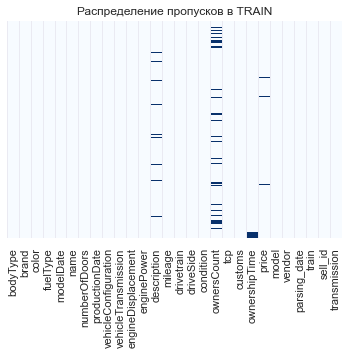

In [114]:
# Посмотрим, как распределены пропуски в части train
ax = plt.axes()
sns.heatmap(data[data.train == 1].isnull(),
            yticklabels=False, cbar=False, cmap='Blues')
ax.set_title('Распределение пропусков в TRAIN')
plt.show()

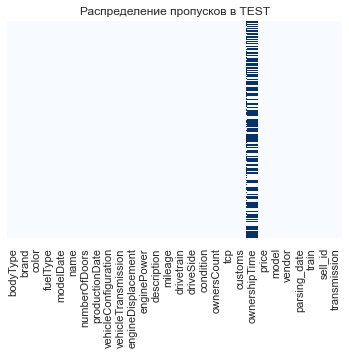

In [115]:
# Посмотрим, как распределены пропуски в части test
ax = plt.axes()
sns.heatmap(data[data.train == 0].isnull(),
            yticklabels=False, cbar=False, cmap='Blues')
ax.set_title('Распределение пропусков в TEST')
plt.show()

#### price

In [116]:
# Проверим, что price отсуствует именно в train данных и мы не затроним test
data[data.price.isnull() == True]['train'].value_counts()

1    742
Name: train, dtype: int64

In [117]:
# Удаляем строки с price = NAN
data.dropna(subset=['price'], inplace=True)

**Гипотеза, что NAN с одной строкой - это одна и та же запись**

In [118]:
# Посмотрим на запись
data[data.modelDate.isnull() == True]

,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,vehicleTransmission,...,tcp,customs,ownershipTime,price,model,vendor,parsing_date,train,sell_id,transmission
24624,nan,HONDA,серебристый,универсал,<NA>,NaN,<NA>,1989,NaN,NaN,...,оригинал,1,no_data,120000.0,CIVIC,JAPANESE,2020-09-09,1,0,NaN


In [119]:
# Посмотрим, что за строка, где modelDate = NaN
print("Индекс строки к удалению:",
      data[data.modelDate.isnull() == True].index[0])

Индекс строки к удалению: 24624


In [120]:
# Удаляем строку
data.drop([24624], inplace=True)

In [121]:
# Посмотрим на записи
print("Даты парсинга объясвлений:",
      data[data.mileage.isnull() == True]['parsing_date'].unique())
print("Длина датафрейма с пустыми 'mileage', drivetran, model, driveSide:", len(data[(data.mileage.isnull() == True) &
                                                                                     (data.drivetrain.isnull() == True) &
                                                                                     (data.model.isnull() == True) &
                                                                                     (data.driveSide.isnull() == True)]))

Даты парсинга объясвлений: ['2021-08-29T00:00:00.000000000' '2021-08-30T00:00:00.000000000'
 '2021-08-31T00:00:00.000000000']
Длина датафрейма с пустыми 'mileage', drivetran, model, driveSide: 495


In [122]:
# Удалим строки с пропусками
data.drop(data[(data.mileage.isnull() == True) &
               (data.drivetrain.isnull() == True) &
               (data.model.isnull() == True) &
               (data.driveSide.isnull() == True)].index, inplace=True)

#### tcp

Проверим гипотезу, что:
- tcp пустой у новых машин
- tcp пустой там, где это дубликат.

In [123]:
# Посмотрим на пример таких данных
data[data.tcp.isnull() == True].sample(3)

,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,vehicleTransmission,...,tcp,customs,ownershipTime,price,model,vendor,parsing_date,train,sell_id,transmission
74966,внедорожник,VOLKSWAGEN,красный,бензин,2016,1.4 AMT (150 л.с.) 4WD,5,2020,ALLROAD_5_DOORS ROBOT 1.4,робот,...,NaN,1,no_data,1980400.0,TIGUAN,EUROPEAN,2020-09-09,1,0,автомат
19391,пикап,FORD,белый,дизель,2017,3.0d AT (250 л.с.) 4WD,4,2020,PICKUP_TWO AUTOMATIC 3.0d,автоматическая,...,NaN,1,no_data,10543873.0,F_150,AMERICAN,2020-09-09,1,0,автомат
4402,седан,BMW,серый,бензин,2019,218i 1.5 AMT (140 л.с.),4,2020,SEDAN ROBOT 218i,робот,...,NaN,1,no_data,2570000.0,2ER,EUROPEAN,2020-09-09,1,0,автомат


In [124]:
# Сгруппируем данные по году выпуска и выведем медианный пробег и кол-во владельцев
data[data.tcp.isnull() == True].groupby('productionDate')[
    'mileage', 'ownersCount'].median()

,mileage,ownersCount
productionDate,,
1999,276000.0,3.0
2018,0.0,NaN
2019,0.0,NaN
2020,0.0,NaN


In [125]:
# Заполняем test значением дубликат
data.tcp.loc[data[(data.tcp.isnull() == True) & (
    data.train == 0)]['tcp'].index[0]] = 'дубликат'

In [126]:
# Смотрим, какой mileage у оставшихся записей. Удостоверимся, что это авто без пробега
data[data.tcp.isnull() == True].mileage.value_counts()

0.0    348
Name: mileage, dtype: int64

In [127]:
# Заполняем значением "новое авто"
data.tcp.fillna('оригинал', inplace=True)

In [128]:
# Проверяем, что получилось
data.tcp.value_counts()

оригинал    106494
дубликат     15022
Name: tcp, dtype: int64

#### description  

Пропуски заполнить проблематично, перед постраением модели признак удалим, пока оставим.

In [129]:
# добавим колонку в список на удаление перед построением модели
cols_removal.append('description')

#### ownershipTime 

Попробуем восстановить информацию о времени владении, исходя из информации в productionDate.

Создадим на базе признака колонку, в которой поместим информацию о количестве месяцев владения автомобилем.

In [130]:
# Создаем новый столбец с количеством месяцев владения
data['ownershipTimeMonths'] = data['ownershipTime'].apply(num_of_months)

In [131]:
# Пока заполняем пропуски no_data, далее решаем, что сделать с признаком
data['ownershipTime'] = data['ownershipTime'].fillna('no_data')

In [132]:
# Смотрим, что получилось
data[data.ownershipTime != 'no_data'][[
    'ownershipTime', 'ownershipTimeMonths']].sample(5)

,ownershipTime,ownershipTimeMonths
67700,5 лет и 9 месяцев,69.0
118244,1 год и 4 месяца,16.0
15503,6 лет и 5 месяцев,77.0
103737,3 года и 2 месяца,38.0
91644,1 год и 2 месяца,14.0


У 65% записей данные о времени владении отсутсвует. Проверим гипотезу, что есть какая-то взаимосвязь между ownershipTimeMonths и productionDate.

In [133]:
# Извлечм орипнтировочную информацию о количестве месяцев после производства
data['prodTimeMonths'] = data.apply(lambda x: (
    x['parsing_date'].year - x['productionDate'])*12, axis=1)

In [134]:
# Посмотрим, как распределены статистики по признакам
data[(data.ownershipTimeMonths.isnull() == False) & (
    data.productionDate != 2020)][['prodTimeMonths', 'ownershipTimeMonths']].describe()

,prodTimeMonths,ownershipTimeMonths
count,41026.000000,41026.000000
mean,129.813582,48.512407
std,78.336214,43.390101
min,0.000000,1.000000
25%,84.000000,16.000000
50%,120.000000,35.000000
75%,168.000000,72.000000
max,1392.000000,514.000000


In [135]:
# Добавим признак, показывающий во сколько раз время после производства больше времени владения
data['prodTime_ownershipTime'] = data.apply(
    lambda x: x['prodTimeMonths']/x['ownershipTimeMonths'], axis=1)

In [136]:
# Посмотрим статистики
data.prodTime_ownershipTime.describe()

count    41178.000000
mean         9.176256
std         21.475332
min          0.000000
25%          1.230769
50%          2.666667
75%          7.200000
max        384.000000
Name: prodTime_ownershipTime, dtype: float64

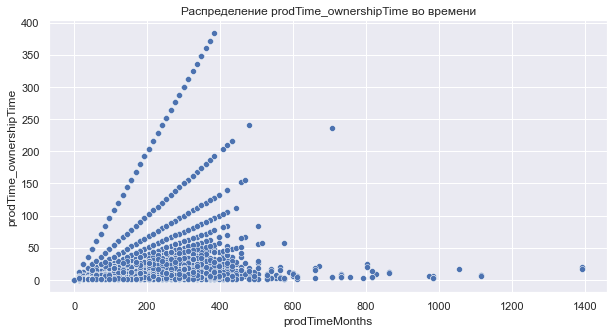

In [137]:
# Посмотрим на графики
fig, ax = plt.subplots(figsize=(10, 5))
sns.scatterplot(data=data, x='prodTimeMonths', y="prodTime_ownershipTime")
ax.set_title('Распределение prodTime_ownershipTime во времени')
plt.show()

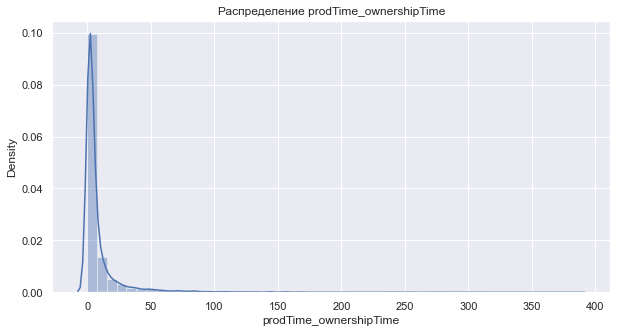

In [138]:
# Посмотрим на распределение признака
fig, ax = plt.subplots(figsize=(10, 5))
sns.distplot(data['prodTime_ownershipTime'])
ax.set_title('Распределение prodTime_ownershipTime')
plt.show()

In [139]:
# Заполним нулями признак для новых автомобилей
data['ownershipTimeMonths'].loc[(data['mileage'] == 0) & (
    data['ownershipTimeMonths'].isnull() == True)] = 0

In [140]:
# Удалим служебные признаки, которые создавали для вычислений
data.drop(['prodTime_ownershipTime', 'prodTimeMonths'], axis=1, inplace=True)

In [141]:
# Добавим исходную колонку в список на удаление перед построением модели, т.к. пропусков очень много
cols_removal.append('ownershipTime')
cols_removal.append('ownershipTimeMonths')

#### ownersCount

Количество владельцев. Машины с нулевым пробегом, заполним 0 владельцев

In [142]:
# Все пропуски по значению находятся в train части
data[data.ownersCount.isnull() == True].train.value_counts()

1    10535
Name: train, dtype: int64

In [143]:
# Посмотрим по данным с незаполненным количетсвом владельцев медианные значения метрик.
data[data.ownersCount.isnull() == True].groupby('productionDate').median()

,modelDate,engineDisplacement,enginePower,mileage,condition,ownersCount,customs,price,train,sell_id,ownershipTimeMonths
productionDate,,,,,,,,,,,
2017,2015,5.0,424.0,0.0,0,NaN,1,3829900.0,1,0,0.0
2018,2018,3.0,367.0,0.0,0,NaN,1,6570070.0,1,0,0.0
2019,2017,2.5,249.0,0.0,0,NaN,1,4054000.0,1,0,0.0
2020,2018,2.0,184.0,0.0,0,NaN,1,2989500.0,1,0,0.0


In [144]:
data[data.ownersCount.isnull() == True]['mileage'].describe()

count    10535.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: mileage, dtype: float64

In [145]:
# Заполняем пропуски 0
data['ownersCount'].fillna(0, inplace=True)

In [146]:
# Приведем значение признака из float в int
data['ownersCount'] = data['ownersCount'].astype('int64')

<a id="3.5"></a> 
### [3.5 Детальный анализ признаков](#0)

#### Группировка признаков на категориальные, бинарные и числовые

In [147]:
# Посмотрим, сколько уникальных значений
print("Количество уникальных категорий в признаках.")
data.nunique(dropna=False)

Количество уникальных категорий в признаках.


bodyType                    16
brand                       36
color                       16
fuelType                     5
modelDate                   79
name                      5235
numberOfDoors                5
productionDate              81
vehicleConfiguration      2026
vehicleTransmission          4
engineDisplacement          69
enginePower                398
description             100628
mileage                  24685
drivetrain                   3
driveSide                    2
condition                    1
ownersCount                  4
tcp                          2
customs                      1
ownershipTime              355
price                     8304
model                     1230
vendor                       4
parsing_date                10
train                        2
sell_id                  34687
transmission                 2
ownershipTimeMonths        310
dtype: int64

In [148]:
# Выведем пример признаков на экран
print("Выведем пример значений признаков одной из записей датасета.")
data.loc[5]

Выведем пример значений признаков одной из записей датасета.


bodyType                                                            седан
brand                                                                AUDI
color                                                             зелёный
fuelType                                                           бензин
modelDate                                                            1990
name                                                    2.8 MT (174 л.с.)
numberOfDoors                                                           4
productionDate                                                       1993
vehicleConfiguration                                 SEDAN MECHANICAL 2.8
vehicleTransmission                                          механическая
engineDisplacement                                                    2.8
enginePower                                                           174
description             Хорошая комплектация: климат, эл. стекла, эл. ...
mileage                               

In [149]:
# Посмотрим, на колонки, которые планируем в последствие удалить, чтобы не включать их в анализ
print("Признаки для последующего удаления:", cols_removal)

Признаки для последующего удаления: ['parsing_date', 'vehicleConfiguration', 'name', 'description', 'ownershipTime', 'ownershipTimeMonths']


In [150]:
# Создадим списки с разными категориями признаков
# бинарные признаки
bin_cols = ['condition', 'customs', 'driveSide', 'transmission', 'tcp']

# категориальные переменные
cat_cols = ['bodyType', 'brand', 'color', 'fuelType', 'drivetrain',
            'model', 'vendor', 'vehicleTransmission', 'numberOfDoors', 'ownersCount']

# числовые переменные
num_cols = ['modelDate', 'productionDate',
            'enginePower', 'mileage', 'engineDisplacement']

# сервисные переменные
service_cols = ['train', 'sell_id', 'parsing_date']

# целевая переменная
target_col = ['price']

all_cols = bin_cols + cat_cols + num_cols + service_cols + target_col

print("Кол-во столбцов, для дальнейшей работы после предварительного анализа:", len(all_cols))

Кол-во столбцов, для дальнейшей работы после предварительного анализа: 24


#### Числовые переменные: распределение, корреляционный анализ, определение значимости

###### Распределние численных признаков.

Диаграмы распределения числовых признаков, взаимосвязь с целевой переменной


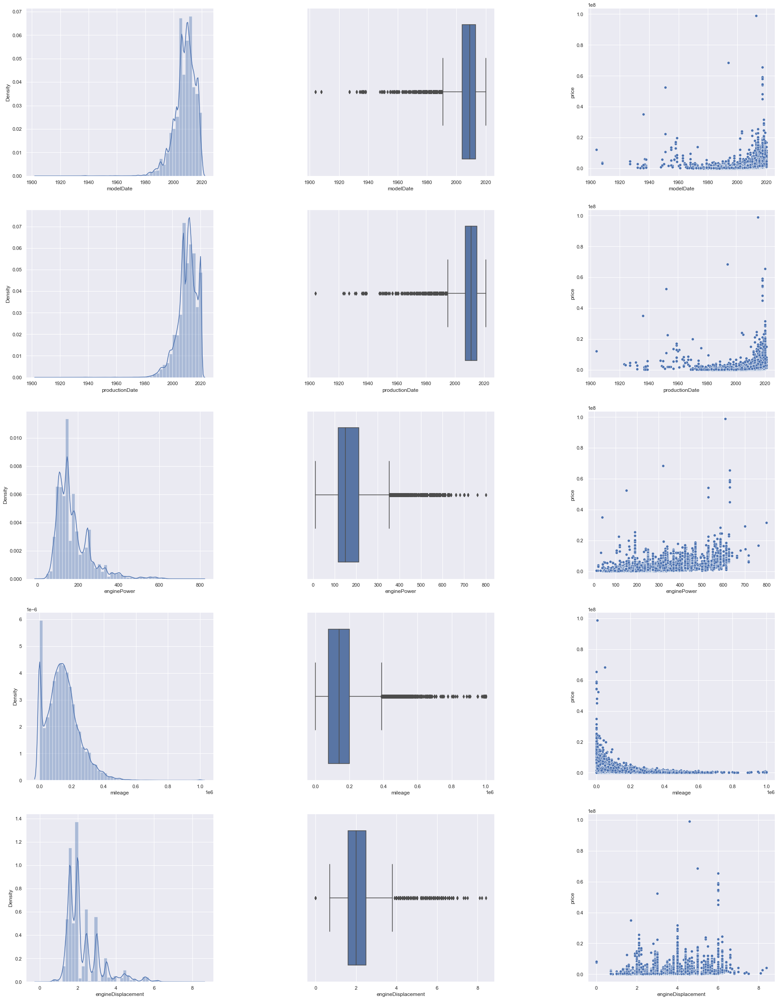

In [151]:
# Построим распределение основных числовых признаков

print("Диаграмы распределения числовых признаков, взаимосвязь с целевой переменной")

fig, axes = plt.subplots(5, 3, figsize=(30, 40))
plt.subplots_adjust(wspace=0.5)
axes = axes.flatten()
i = 0

for col in num_cols:
    sns.distplot(data[col], ax=axes[i])
    i = i + 1
    sns.boxplot(data[col], ax=axes[i])
    i = i + 1
    sns.scatterplot(data=data[data['train'] == 1],
                    x=col, y="price", ax=axes[i])
    i = i + 1

In [152]:
print("Основные статистики для числовых признаков.")
display(data[num_cols].describe())

Основные статистики для числовых признаков.


,modelDate,productionDate,enginePower,mileage,engineDisplacement
count,121516.000000,121516.000000,121516.000000,121516.000000,121355.000000
mean,2007.937506,2010.195629,176.254403,145711.380929,2.269021
std,7.379614,6.988713,86.054148,101701.727285,0.915675
min,1904.000000,1904.000000,11.000000,0.000000,0.000000
25%,2004.000000,2007.000000,117.000000,75000.000000,1.600000
50%,2009.000000,2011.000000,150.000000,138000.000000,2.000000
75%,2013.000000,2015.000000,211.000000,200000.000000,2.500000
max,2020.000000,2021.000000,800.000000,1000000.000000,8.400000


#### Корреляционный анализ.


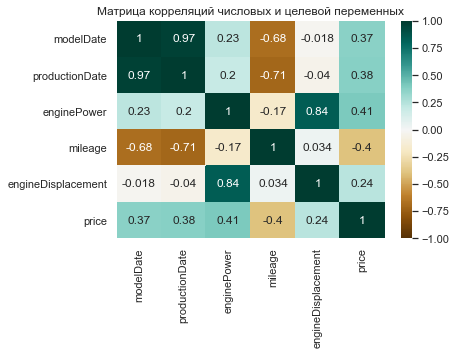

In [153]:
# Построим матрицу корреляций
heatmap = sns.heatmap(data[num_cols + target_col].corr(), vmin=-1,
                      vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Матрица корреляций числовых и целевой переменных')
plt.show()

In [154]:
# Добавляем modelDate в список колонок на удаление.
cols_removal.append('modelDate')
cols_removal.append('engineDisplacement')

#### Дополнительный анализ числовых признаков

**mileage**

Дополнительно поисследуем признак.

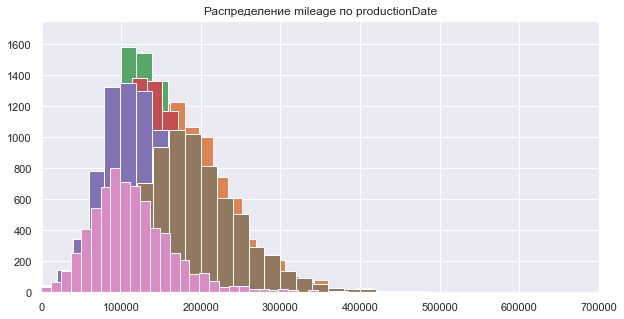

In [155]:
# Посмотрим на топ 5 годов выпуска авто
fig, ax = plt.subplots(figsize=(10, 5))

for x in (data['productionDate'].value_counts())[0:7].index:
    data['mileage'][data['productionDate'] == x].hist(bins=50)

ax.set_xlim(0, 700000)
ax.set_ylim(0, 1750)

plt.title("Распределение mileage по productionDate")
plt.show()

mileage имеет нормальное распределение, с правым смещением, если смотреть на графики по годам производства, а не на все числа. 

Cоздадим новый признак:   
km_per_year - показывает, сколько км в год проезжал автомобиль.   
Вычисляется, как mileage`/`productionDate(years)  

**enginePower**

Нужно поисследовать странное минимальное значение мощности.

In [156]:
print("Значение мощности двигателя (л.с.) на TEST")
display(data[data.train == 0]['enginePower'].describe())

print("\nЗначение мощности двигателя (л.с.) на TRAIN")
display(data[data.train == 1]['enginePower'].describe())

Значение мощности двигателя (л.с.) на TEST


count    34686.000000
mean       188.194142
std         89.087035
min         30.000000
25%        125.000000
50%        169.000000
75%        233.000000
max        639.000000
Name: enginePower, dtype: float64


Значение мощности двигателя (л.с.) на TRAIN


count    86830.000000
mean       171.484832
std         84.341663
min         11.000000
25%        115.000000
50%        150.000000
75%        200.000000
max        800.000000
Name: enginePower, dtype: float64

Видим, что в Test значение минимума - больше, а максимума - меньше. Посмотрим, что это за авто и сколько их.

In [157]:
print("Строки, в которых мощность двигателя меньше 30 л.с.")
data[data.enginePower < data[data.train == 0]['enginePower'].min()]

Строки, в которых мощность двигателя меньше 30 л.с.


,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,vehicleTransmission,...,customs,ownershipTime,price,model,vendor,parsing_date,train,sell_id,transmission,ownershipTimeMonths
22691,кабриолет,FORD,зелёный,бензин,1908,2.9 MT (20 л.с.),2,1923,CABRIO MECHANICAL 2.9,механическая,...,1,no_data,3800000.0,MODEL_T,AMERICAN,2020-09-09,1,0,механическая,NaN
22692,кабриолет,FORD,чёрный,бензин,1908,2.9 MT (20 л.с.),2,1924,CABRIO MECHANICAL 2.9,механическая,...,1,no_data,3000000.0,MODEL_T,AMERICAN,2020-09-09,1,0,механическая,NaN
59955,купе,RENAULT,белый,электро,2011,Electro AT (13 кВт),2,2012,COUPE AUTOMATIC Electro,автоматическая,...,1,1 год и 3 месяца,449000.0,TWIZY,EUROPEAN,2020-09-09,1,0,автомат,15.0
59956,купе,RENAULT,чёрный,электро,2011,Electro AT (9 кВт),2,2016,COUPE AUTOMATIC Electro,автоматическая,...,1,1 год и 4 месяца,549000.0,TWIZY,EUROPEAN,2020-09-09,1,0,автомат,16.0


In [158]:
print("Строки, в которых мощность двигателя более 639 л.с.")
data[data.enginePower > data[data.train == 0]['enginePower'].max()]

Строки, в которых мощность двигателя более 639 л.с.


,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,vehicleTransmission,...,customs,ownershipTime,price,model,vendor,parsing_date,train,sell_id,transmission,ownershipTimeMonths
18731,купе,DODGE,синий,бензин,2014,Hellcat 6.2 AT (717 л.с.),2,2016,COUPE AUTOMATIC Hellcat,автоматическая,...,1,1 год и 6 месяцев,6500000.0,CHALLENGER,AMERICAN,2020-09-09,1,0,автомат,18.0
18733,купе,DODGE,серый,бензин,2014,Hellcat 6.2 AT (717 л.с.),2,2016,COUPE AUTOMATIC Hellcat,автоматическая,...,1,no_data,5990000.0,CHALLENGER,AMERICAN,2020-09-09,1,0,автомат,NaN
18832,пикап,DODGE,серый,бензин,2018,Crew Cab TRX 6.2 AT (702 л.с.) 4WD,4,2020,PICKUP_TWO AUTOMATIC Crew,автоматическая,...,1,no_data,14433255.0,RAM,AMERICAN,2020-09-09,1,0,автомат,0.0
23483,купе,FORD,красный,бензин,2009,Shelby GT500 5.8 MT (662 л.с.),2,2013,COUPE MECHANICAL Shelby,механическая,...,1,no_data,9980000.0,MUSTANG,AMERICAN,2020-09-09,1,0,механическая,NaN
23485,купе,FORD,чёрный,бензин,2009,Shelby GT500 5.8 MT (662 л.с.),2,2013,COUPE MECHANICAL Shelby,механическая,...,1,no_data,9000000.0,MUSTANG,AMERICAN,2020-09-09,1,0,механическая,NaN
32411,внедорожник,JEEP,белый,бензин,2013,Trackhawk 6.2 AT (717 л.с.) 4WD,5,2019,ALLROAD_5_DOORS AUTOMATIC Trackhawk,автоматическая,...,1,no_data,10300000.0,GRAND_CHEROKEE,AMERICAN,2020-09-09,1,0,автомат,0.0
57242,седан,PORSCHE,серый,электро,2019,Turbo S Electro AT (561 кВт) 4WD,4,2020,SEDAN AUTOMATIC Turbo,автоматическая,...,1,no_data,16601327.0,TAYCAN,EUROPEAN,2020-09-09,1,0,автомат,0.0
57246,седан,PORSCHE,белый,электро,2019,Turbo Electro AT (501 кВт) 4WD,4,2020,SEDAN AUTOMATIC Turbo,автоматическая,...,1,8 месяцев,13500000.0,TAYCAN,EUROPEAN,2020-09-09,1,0,автомат,8.0
83909,внедорожник,MERCEDES,чёрный,бензин,2018,Brabus 700 4.0 AT (700 л.с.) 4WD,5,2020,ALLROAD_5_DOORS AUTOMATIC Brabus,автоматическая,...,1,no_data,29300000.0,G_KLASSE_AMG,EUROPEAN,2020-09-09,1,0,автомат,0.0
83976,внедорожник,MERCEDES,чёрный,бензин,2018,Brabus 800 4.0 AT (800 л.с.) 4WD,5,2020,ALLROAD_5_DOORS AUTOMATIC Brabus,автоматическая,...,1,no_data,31600000.0,G_KLASSE_AMG,EUROPEAN,2020-09-09,1,0,автомат,0.0


In [159]:
# Таких строк немного, удалим из из дальнейшего анализа
data.drop(data[(data.enginePower > data[data.train == 0]
                ['enginePower'].max()) | (data.enginePower < data[data.train == 0]
                                          ['enginePower'].min())].index, inplace=True)

#### productionDate/modelDate


In [160]:
print("Значение года производства авто на TEST")
display(data[data.train == 0]['productionDate'].describe())

print("\nЗначение года производства авто на TRAIN")
display(data[data.train == 1]['productionDate'].describe())

Значение года производства авто на TEST


count    34686.000000
mean      2009.264602
std          7.047661
min       1904.000000
25%       2006.000000
50%       2011.000000
75%       2014.000000
max       2020.000000
Name: productionDate, dtype: float64


Значение года производства авто на TRAIN


count    86816.000000
mean      2010.568651
std          6.917625
min       1904.000000
25%       2007.000000
50%       2011.000000
75%       2015.000000
max       2021.000000
Name: productionDate, dtype: float64

Детальнее посмотрим, как падает цена в зависимости от productionDate.

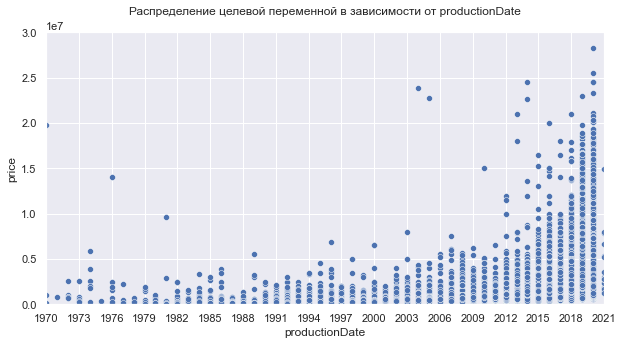

In [161]:
fig, ax = plt.subplots(figsize=(10, 5))

ax.set_xlim(1970, 2021)
ax.set_ylim(0, 30000000)
ax.set_xticks(np.arange(1970, 2022, 3))

sns.scatterplot(data=data[data['train'] == 1], x='productionDate', y="price")

plt.title("Распределение целевой переменной в зависимости от productionDate\n")
plt.show()

Можно найти много информации, что цена автомобиля значительно падает после 3-5 лет эксплуатации. На графиках даная динамика тоже прослеживается. Идеи для новых признаков:
- prodDate_3Y - признак, что автомобилю уже 3 года
- prodDate_5Y - признак, что автомобилю уже 5 лет.

#### Категориальные и бинарные переменные: конвертация в числовые

##### Распределение признаков

Посмотрим на распределение признаков.

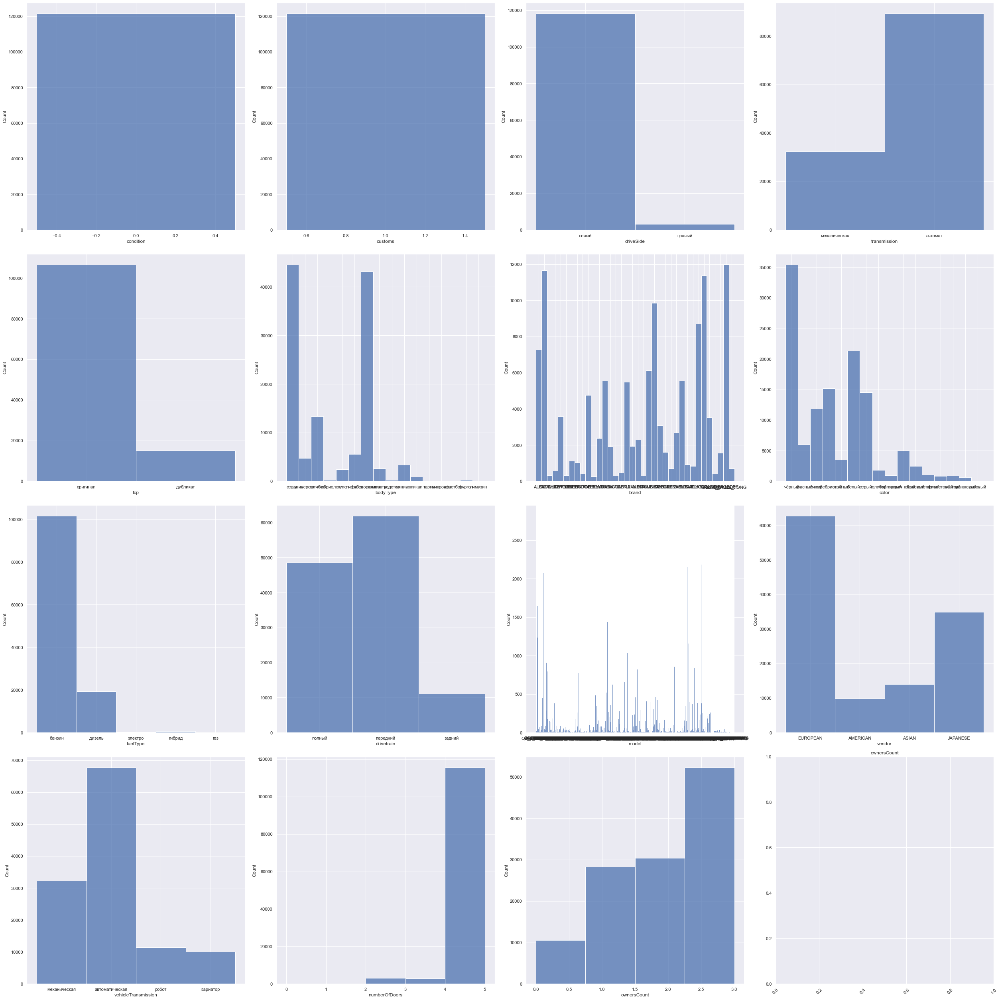

In [162]:
# Построим распределение основных бинарных и категориальных признаков

fig, axes = plt.subplots(4, 4, figsize=(35, 35))
plt.subplots_adjust(wspace=0.5)
axes = axes.flatten()
i = 0

for col in (bin_cols + cat_cols):
    sns.histplot(data=data, x=data[col], ax=axes[i],
                 stat='count', bins=data[col].nunique())
    plt.tight_layout()
    plt.xticks(rotation=45)
    plt.title(col)
    i = i + 1

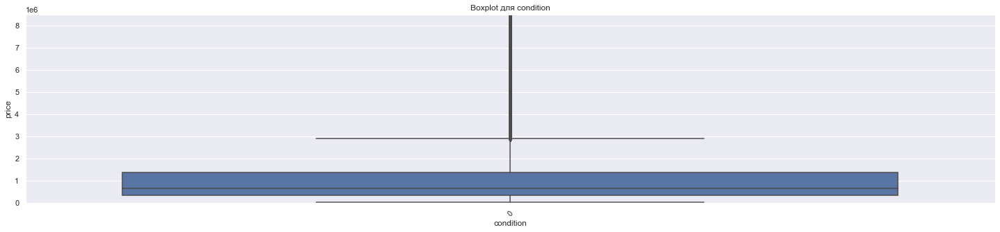

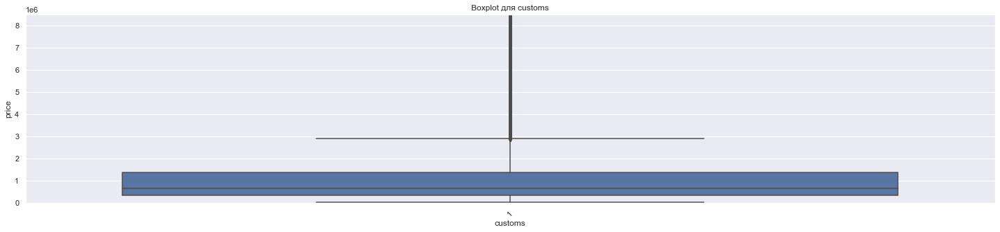

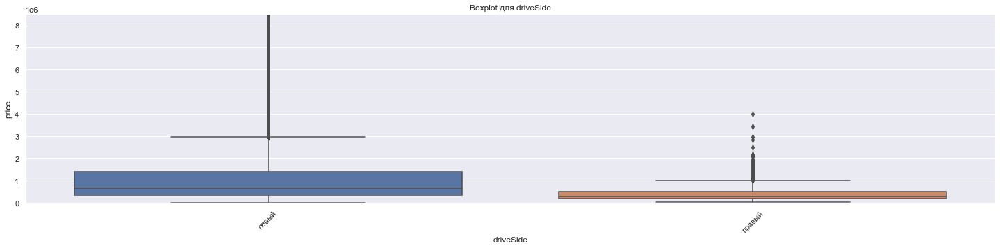

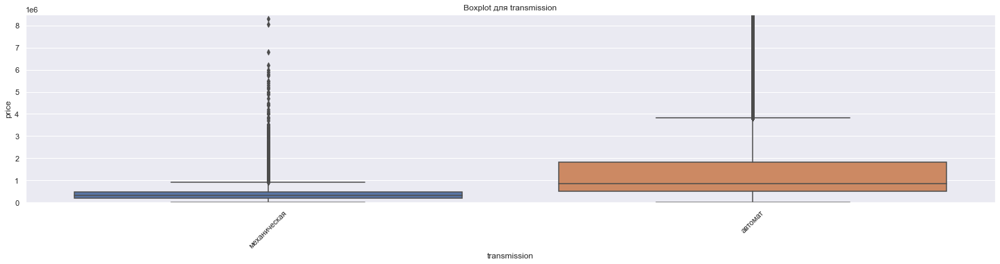

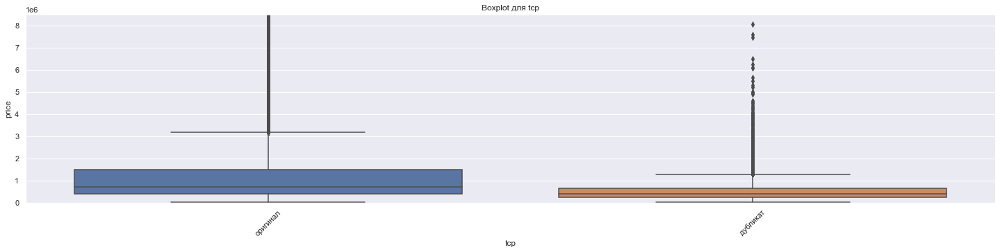

...

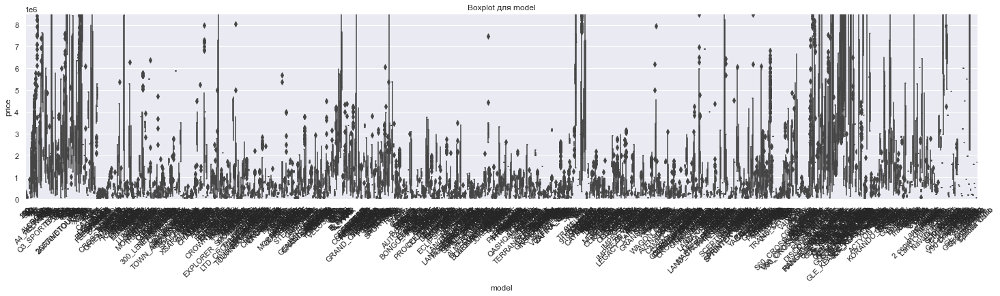

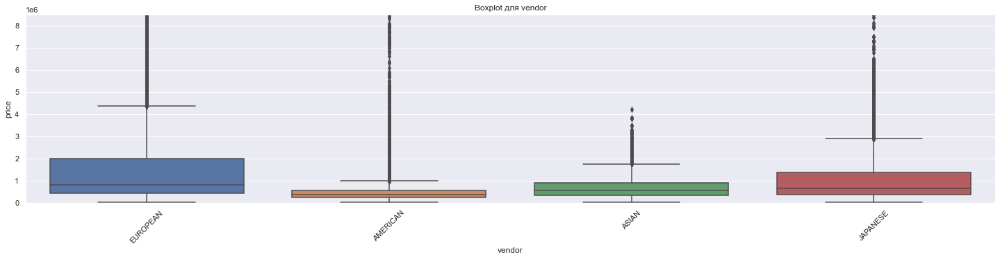

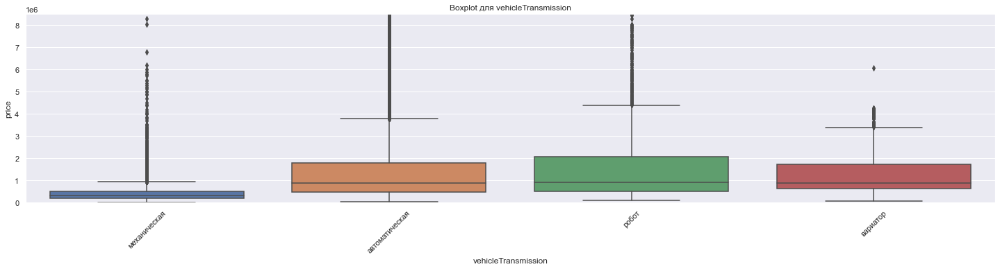

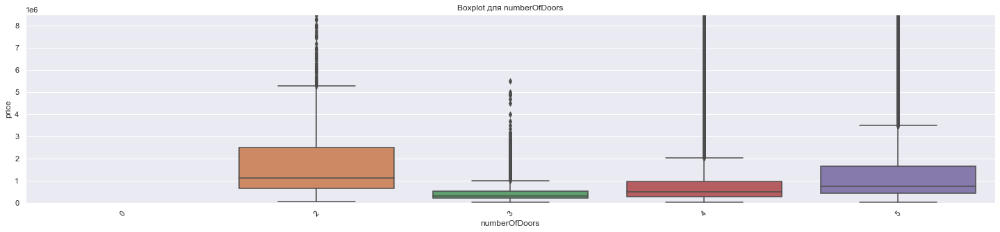

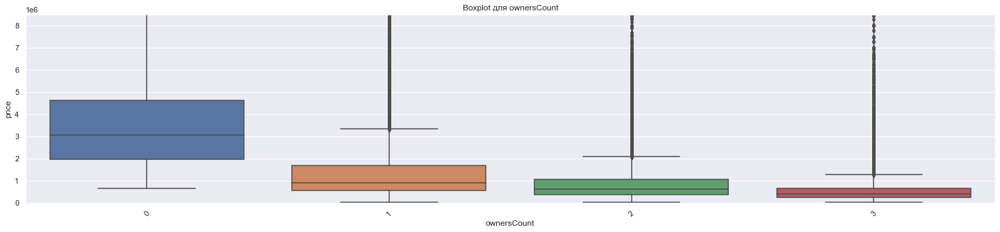

In [163]:
# Построим график boxplot

for col in (bin_cols + cat_cols):    
    get_boxplot(col)

Выводы по всем графикам:
1. Полностью сбалансированные признаки отсутсвуют.
2. Особо несбалансированные признаки: 
- driveSide - правосторонни машины в большинстве => поисследовать, есть ли левосторонние машины в тесте. Если нет, то удалить признак
    - bodyType - некоторые категории представлены небольшим количеством машин, но boxplot показывает значительные различия и распределение по ценам. Идея схлопнуть малочисленные категории в other кажется не очень хорошей, т.к. разброс медианных цен очень большой для этих категорий. Оставлим пока признак, как есть.
    - brand - много категорий, заметно, что есть массовые, среднепопулярные и редкие бренды авто. Поисследовать дополнительно и подумать над созданием новых признаков (престижные авто/люкс, популярные и т.д.)
    - color - есть популярные цвета (черный, белый, серый, серебристый, синий) и редкие. Посмотреть дополнительно и создать новый признак о популярности цвета
    - fuelType - есть типы топлива, которые в явном меньшинстве. Поисследовть и подумать, стоит ли делать группировку непопулярных типов топлива
    - tcp - несбалансированный признак, но пока оставляем в модели
    - model - очень много уникальных категорий, подумать, можно ли как-то доработать признак. Подумать про объединение brand + model
    - numberOfDoors - малое количество машин в 0-3 - изучить детальнее

3. Сбалансированные признаки с заметно превалирующим классом:
    - ownershipTimeIsNull - большая часть записей без указания времени владения
    - transmission - автомат превалирует
    - drivertrain - передний привод встречается чаще всего
    - vendor - большее количество автомобилей европейского региона
    - ownersCount - привалирует 3 и более.
4. Неинформативные признаки: conditions, customs - после манипуляций с данными в признаках осталось только одно значение. Удаляем из анализа.
5. Зависимость с целевой переменной:
    - ownershipTimeIsNull: машины без указания времени владения в среднем дешевле, чем машины с указанием времени владения
    - driveSide: авто с правосторонним рулем в среднем дешевле машин с левосторонним рулем
    - transmission: авто с АТ коробкой намного дороже MT, как и сам диапазон цен
    - bodyType: признак, который значительно влияет на распределение цен
    - brand: большая разбежка цен от бренда. Выделяются престижные авто (porche, Cadillac, bmw, and Rover, Lexus и др), а есть дешевый сегмент (азиатские авто - Cherry, Daewoo, Great wall и др.). Также видны бренды, которые выпускают дорогие авто, но и есть модели для более дешевого сегмента.
    - color: цены зависят от цвета, но большие цены представлены у цветов, количество авто по которым больше. 
    - fuelType: очень дорогие машины электро и дизель, возможно выделить отдельный признак, что машина “электрокар”
    - drivetrain: полноприводные машины дороже всех, заднеприводные машины в среднем дешевле переднеприводных
    - tcp авто с дубликатом ПТС дешевле чем те, что с оригиналом
    - model - данных много, но видно, что присутствую колебания цены в зависимости от модели
    - vendor: в среднем, европейские и японские машины дороже американских и азиатских
    - vehicleTransmission: в среднем разновидности автоматов особо не влияют на цену, проверить значимость признака тестом Стьюдента. Потенциально на исключение.
    - numberOfDoors: в среднем самые дорогие авто - 2-х дверные, затем 5-дверные.
    - ownersCount: чем больше владельцев, тем ниже средняя цена авто.

In [164]:
# Добавляем modelDate в список колонок на удаление.
cols_removal.append('condition')
cols_removal.append('customs')

###### Дополнительный анализ бинарных и категориальных признаков

Посмотрим более пристально на признаки, которые не исключили из анализа и по которым возникли вопросы/требуется дополнительное исследование после предварительного анализа.

#### driveSide

In [165]:
# Проверяем распределение признака в test
test.driveSide.value_counts(normalize=True)

Левый     0.959667
Правый    0.040333
Name: driveSide, dtype: float64

4% данных в тесте левосторонние. Оставляем, как есть, т.е. обоготить данные пока не можем.

#### brand

Марка машины.

In [166]:
print(
    f'Список категорий brand в test, которые не представлены в train: \n{list(set(data[data.train == 0].brand.unique()).difference(data[data.train == 1].brand.unique()))}')
print(
    f'\nСписок зачений brand в train, по которым не нужно делать предсказания в test: \n{list(set(data[data.train == 1].brand.unique()).difference(data[data.train == 0].brand.unique()))}')

Список категорий brand в test, которые не представлены в train: 
[]

Список зачений brand в train, по которым не нужно делать предсказания в test: 
['PORSCHE', 'KIA', 'OPEL', 'DAEWOO', 'FORD', 'JAGUAR', 'SUZUKI', 'SSANG_YONG', 'MAZDA', 'SUBARU', 'GREAT_WALL', 'RENAULT', 'CITROEN', 'MINI', 'PEUGEOT', 'CHEVROLET', 'DODGE', 'LAND_ROVER', 'JEEP', 'CHRYSLER', 'CADILLAC', 'CHERY', 'HYUNDAI', 'GEELY']


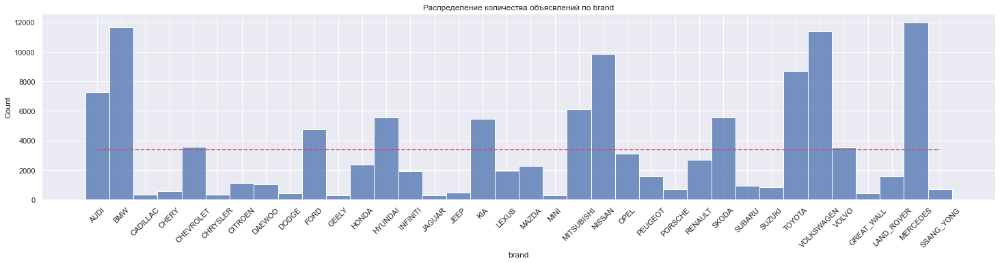

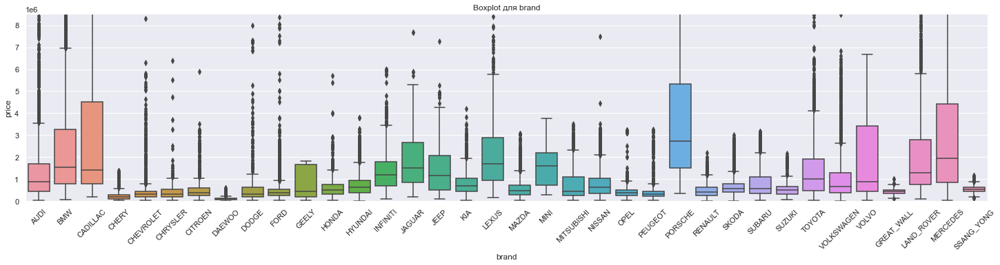

In [167]:
# Посмотрим внимательно на графики еще раз
analyze_cat_cols('brand')

Можно создать новые признаки:
- флаг популярного авто: за ориентир взять значение data['brand'].value_counts() > data['brand'].value_counts().values.mean()`
- обычно на цену сильно влияет класс автомобиля (brand + bodyType) попробовать добавить признак с помощью метода главных компонент.

Также в train присутсвует значительно большее количество брендов, чем в трейне. Учитывать при обработке выбросов.

#### model

Модель машины.

In [168]:
print(
    f'Список категорий brand в test, которые не представлены в train: \n{list(set(data[data.train == 0].model.unique()).difference(data[data.train == 1].model.unique()))}')
print(
    f'\nСписок зачений brand в train, по которым не нужно делать предсказания в test: \n{list(set(data[data.train == 1].model.unique()).difference(data[data.train == 0].model.unique()))}')

Список категорий brand в test, которые не представлены в train: 
['X4_M', 'RSQ3', 'SPARKY', 'GOLF_R32', 'Z', 'TORNEO', 'LANCER_RALLIART', 'ARTEON', 'WILL_CYPHA', 'ZEST', '300ZX', 'POLO_GTI', 'COROLLA_II', 'IST', 'OTTI', 'LM', 'PRESEA', 'PORTE']

Список зачений brand в train, по которым не нужно делать предсказания в test: 
['KORANDO_SPORTS', 'C3', 'TITAN', 'LASER', 'CLA', 'ZAFIRA_OPC', 'DEER', 'SPARK', 'SOLARIS', 'CEED', 'MEGANE', 'MONDEO_ST', 'EMGRAND_7', 'SIDEKICK', 'RAM', '605', 'Karoq', 'MONZA', 'CAYMAN_GT4', 'VISION', 'CLIO', 'IMPALA', 'Land Cruiser Prado', 'LTD_CROWN_VICTORIA', 'XCEED', 'BT_50', '508', 'INTREPID', 'COMBO', 'ARKANA', 'DS4', 'Crown', 'JOURNEY', 'C4_AIRCROSS', 'SPACETOURER', 'C6', 'AXELA', 'MX_5', 'MAGNUS', '208', 'GLE AMG', 'CORVETTE', 'XANTIA', '5', 'Pajero', 'Stepwgn', 'VELOSTER', 'RS 5', 'CRUZE', 'HATCH', 'ADMIRAL', '307', '2', 'ASTRA', 'LANTRA', 'EQUUS', 'Presage', 'ALERO', 'MERIVA', 'LACETTI', 'SOLIO', 'Passo', 'Colt', 'Eclipse Cross', 'AVELLA', 'SPECTRA', 'EC

#### color

Есть популярные цвета (черный, белый, серый, серебристый, синий) и редкие. Посмотреть дополнительно и создать новый признак о популярности цвета.

In [169]:
print(
    f'Список категорий brand в test, которые не представлены в train: \n{list(set(data[data.train == 0].color.unique()).difference(data[data.train == 1].color.unique()))}')
print(
    f'\nСписок зачений brand в train, по которым не нужно делать предсказания в test: \n{list(set(data[data.train == 1].color.unique()).difference(data[data.train == 0].color.unique()))}')

Список категорий brand в test, которые не представлены в train: 
[]

Список зачений brand в train, по которым не нужно делать предсказания в test: 
[]


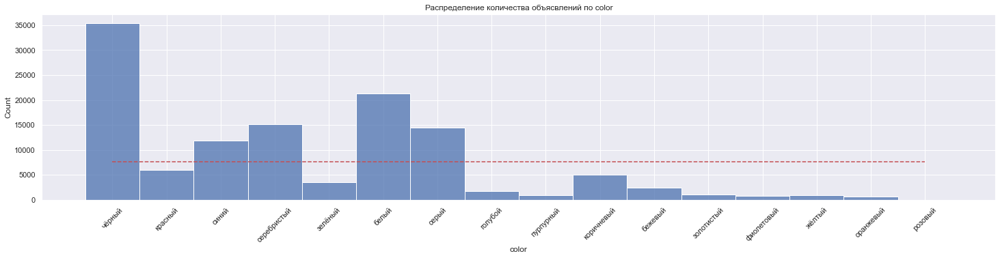

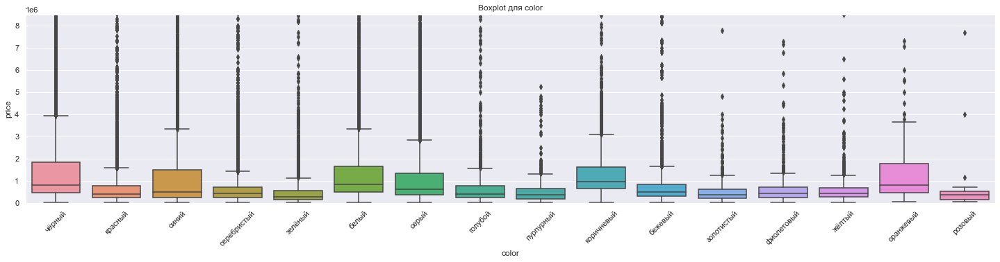

In [170]:
# Посмотрим внимательно на графики еще раз
analyze_cat_cols('color')

Создадим признак популярного авто: за ориентир взять значение data['color'].value_counts() > data['color'].value_counts().values.mean()

Перечень категорий цветов идентичен в train и test.

#### fuelType

Есть типы топлива, которые в явном меньшинстве. Поисследовть и подумать, стоит ли делать группировку непопулярных типов топлива.

In [171]:
print(
    f'Список категорий brand в test, которые не представлены в train: \n{list(set(data[data.train == 0].fuelType.unique()).difference(data[data.train == 1].fuelType.unique()))}')
print(
    f'\nСписок зачений brand в train, по которым не нужно делать предсказания в test: \n{list(set(data[data.train == 1].fuelType.unique()).difference(data[data.train == 0].fuelType.unique()))}')

Список категорий brand в test, которые не представлены в train: 
[]

Список зачений brand в train, по которым не нужно делать предсказания в test: 
[]


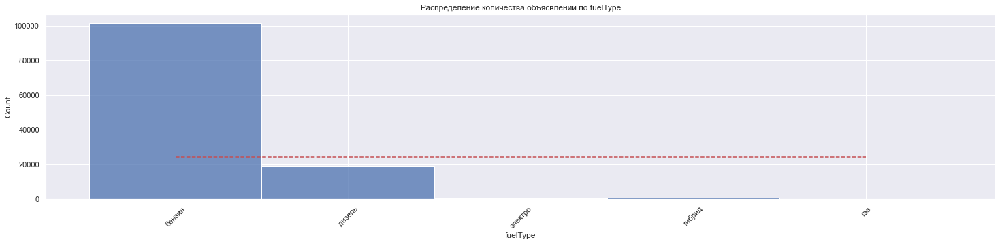

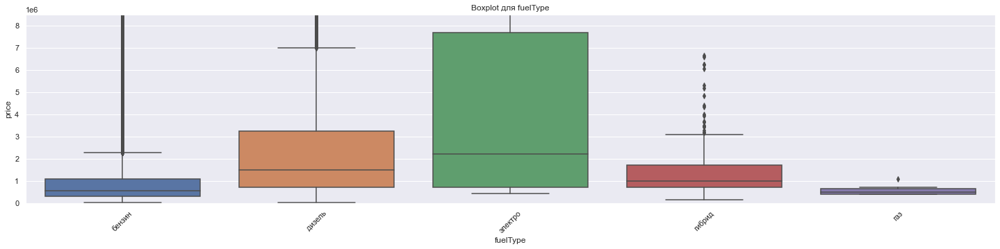

In [172]:
# Посмотрим внимательно на графики еще раз
analyze_cat_cols('fuelType')

In [173]:
print(
    f'Список зачений по fuelType в трейне:= {list(data[data.train ==0].fuelType.unique())}')
print(
    f'Список зачений по fuelType в тесте:= {list(data[data.train ==0].fuelType.unique())}')

Список зачений по fuelType в трейне:= ['бензин', 'дизель', 'гибрид', 'электро', 'газ']
Список зачений по fuelType в тесте:= ['бензин', 'дизель', 'гибрид', 'электро', 'газ']


In [174]:
# Посмотрим, какие бренды представлены в "электро" типе топлива в трейне и тесте
data[data['fuelType'] == 'электро'].groupby(
    ['train', 'brand'])['bodyType'].count()

train  brand     
0      AUDI           1
       BMW            9
       MERCEDES       1
       MITSUBISHI     2
       NISSAN        40
       VOLKSWAGEN     2
1      AUDI          39
       BMW            7
       CHEVROLET      1
       FORD           1
       JAGUAR         5
       MERCEDES       3
       MITSUBISHI     2
       NISSAN        42
       PORSCHE        3
       VOLKSWAGEN     1
Name: bodyType, dtype: int64


- перечень категорий цветов идентичен в train и test.
- категории для данного признака оставим, как есть, т.к. сильно влияет на распределение цен
- идея для генерации нового признака - добавить флаг "электрокар"
- использовать информацию по распределению типа топлива-бренд между train и test для обработки выбросов. Возможно, какие-то данные придется удалить

#### numberOfDoors

Проверка на вброс. 0 - выброс/ошибка или валидная запись.

In [175]:
# Посмотрим на записи с кол-вом дверей менее 2
data[data.numberOfDoors < 2]

,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,vehicleTransmission,...,customs,ownershipTime,price,model,vendor,parsing_date,train,sell_id,transmission,ownershipTimeMonths
88065,кабриолет,MERCEDES,белый,бензин,1904,5.3 MT (32 л.с.),0,1904,CABRIO MECHANICAL 5.3,механическая,...,1,6 лет,12000000.0,SIMPLEX,EUROPEAN,2020-09-09,1,0,механическая,72.0
106322,кабриолет,MERCEDES,белый,бензин,1904,5.3 MT (32 л.с.),0,1904,CABRIO MECHANICAL 5.3,механическая,...,1,6 лет и 8 месяцев,0.0,SIMPLEX,EUROPEAN,2020-10-21,0,1093802104,механическая,80.0


2 раритетных авто, не удаляем

#### description
Посмотрим на признак повнимательнее и подумаем, что мы можем из него извлечь.

In [176]:
# Описание в трейне
data[data.train == 1]['description'].iloc[1]

'Машина в оригинале не гнилая все вопросы по телефону. Птс оригинал, двигатель 1.8 90 л/с, карбюратор родной двигатель масло не ест. '

In [177]:
# Описание в тесте
data[data.train == 0]['description'].iloc[3]

'КОМПЛЕКТ ЗИМНЕЙ (ЛЕТНЕЙ) РЕЗИНЫ ПО СЕЗОНУ В ПОДАРОК!\n\nРАССРОЧКА НА АВТОМОБИЛИ С ПРОБЕГОМ\nСРОК: 12-18 МЕСЯЦЕВ\nПЕРВОНАЧАЛЬНЫЙ ВЗНОС: ОТ 0%\nСУММА РАССРОЧКИ: ОТ 90 т.р. до 4,9 млн.р.\n\nОт метро Рязанский проспект бесплатный проезд до автосалона GENZES\n\nГарантия на автомобили различных марок сроком на 1 ГОД при общем пробеге до 150 000 км\n-Двигатель (бензиновый или дизельный)\n-Механическая коробка передач\n-Автоматическая коробка передач\n-Роботизированная коробка передач\n-Вариатор\n-Раздаточная коробка\n-Редуктор заднего моста\n-Редуктор переднего моста\n-Радиатор системы охлаждения\n-Радиатор кондиционера\n\nДополнительные комиссии отсутствуют.\n\nКомфортные условия выбора: бесплатный Wi-Fi, уютное кафе с клиентской зоной, большая и удобная парковка\nВыберите подходящий автомобиль и совершите выгодную покупку в течение 1 дня!\n\nВсе автомобили, представленные в продаже, проходят диагностику по более 48 параметрам, с результатами диагностики Вы можете ознакомиться при осмотре а

Текст объявлений можно удалить, так как сложно проверить достверность описания. Дополнительно можно сверить тескст объевления с данным авто, получив доп переменную правда/ложь.

##### Преобразование бинарных переменных в числа
Чтобы алгоритмы машинного обучения могли работать с категориальными данными, их нужно преобразовать в числа. Применим LabelEncoder ко всему набору бинарных переменных.

In [178]:
# Для бинарных признаков мы будем использовать LabelEncoder
label_encoder = LabelEncoder()

for column in bin_cols:
    data[column] = label_encoder.fit_transform(data[column])

# Убедимся в преобразовании
data[bin_cols].sample(6)

,condition,customs,driveSide,transmission,tcp
90882,0,0,0,1,1
81214,0,0,0,0,1
57117,0,0,0,0,1
19664,0,0,0,1,1
89118,0,0,0,1,1
137327,0,0,0,0,1


#### price
Целевая переменная

In [179]:
print(data[data.train == 1]['price'].describe())

count    8.681600e+04
mean     1.251319e+06
std      1.917853e+06
min      1.600000e+04
25%      3.500000e+05
50%      6.400000e+05
75%      1.370000e+06
max      9.900000e+07
Name: price, dtype: float64


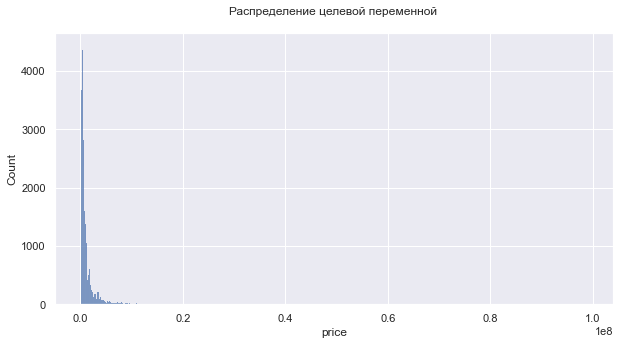

In [180]:
fig, ax = plt.subplots(figsize=(10, 5))
sns.histplot(data=data[data.train == 1], x='price')
plt.title("Распределение целевой переменной \n")
plt.show()

##### price_log

Логарифм от цены.

In [181]:
# Добавляем новый признка
data['price_log'] = data['price'].apply(lambda x: np.log(x))

# Добавим новый признак в список целевых
target_col.append('price_log')

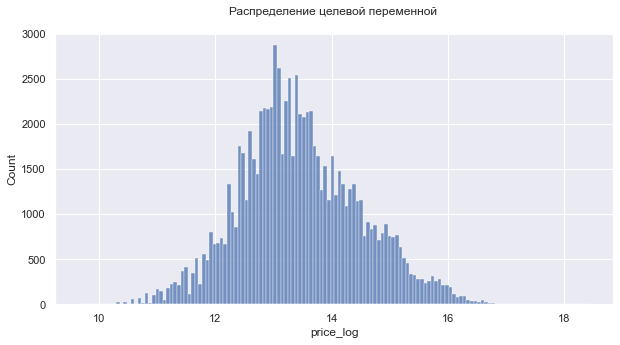

In [182]:
# Посмотрим, как изменилось распределение целевой переменной
fig, ax = plt.subplots(figsize=(10, 5))
sns.histplot(data=data[data.train == 1], x='price_log')
plt.title("Распределение целевой переменной \n")
plt.show()

<a id="3.6"></a>
### [3.6 Генерация новых признаков](#0)

Идеи по генерации новых признаков:
- km_per_year - показывает, сколько км в год проезжал автомобиль. Вычисляется, как mileage`/`productionDate(years) или mileage/ownershipTime. Решить, какой метод использовать
- carNovelty - показывает, через сколько лет после выхода модели был выпущен автомобиль, т.е. modelDate - productionDate. Гипотеза, что чем меньше это число, тем выше будет цена

- prodDate_3Y - признак, что автомобилю уже 3 года
- prodDate_5Y - признак, что автомобилю уже 5 лет
- newCar - признак для обозначения новых авто, пробег равен 0
- descriptionIsNull - признак, показывающий наличие или отсутствие описания
- ownershipTimeIsNull - показывает, заполнено ли время владения авто: 1 - не заполнено, 0 - заполнено
- brandPopular - признак для обозначения, что авто популярной марки: 1 - популярного, 0 - непопулярного
- modelPopular - признак для обозначения, что авто популярной модели в рамках бренда: 1 - популярного, 0 - непопулярного

In [183]:
# Для упрощения повторного анализа для новых признаков добавим списки
cat_cols_new = []
num_cols_new = []
bin_cols_new = []

#### km_per_year

Пробег авто км/год.

In [184]:
# Добавим дополнительный признак 'km_per_year', который равен пробегу, поделенному на возраст авто,
data['km_per_year'] = data.apply(km_per_year, axis=1)

Диаграмы распределения km_per_year признака, взаимосвязь с целевой переменной


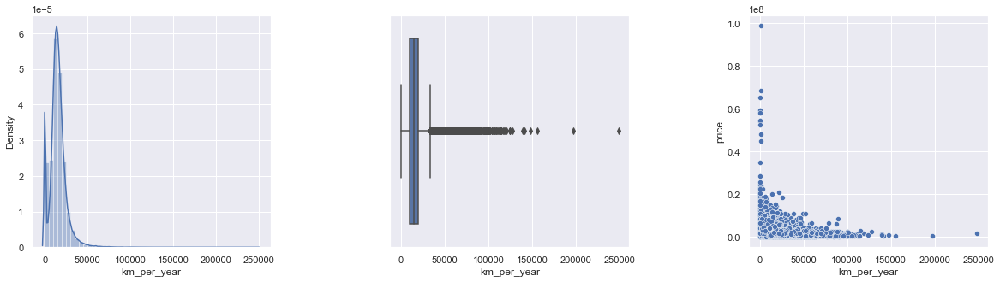

In [185]:
print("Диаграмы распределения km_per_year признака, взаимосвязь с целевой переменной")

fig, axes = plt.subplots(1, 3, figsize=(20, 5))
plt.subplots_adjust(wspace=0.5)
axes = axes.flatten()

sns.distplot(data['km_per_year'], ax=axes[0])
sns.boxplot(data['km_per_year'], ax=axes[1])
sns.scatterplot(data=data[data['train'] == 1],
                x='km_per_year', y="price", ax=axes[2])
plt.show()

In [186]:
# добавляем новые признак
num_cols.append('km_per_year')

In [187]:
num_cols_new.append('km_per_year')

carNovelty

Новизна машины: через сколько лет после появления модели авто была произведена машина. 

In [188]:
# Добавим'dateModelProdDiff', равный разнице между годом выпуска авто и годом начала производства модели
data['carNovelty'] = data['productionDate'] - data['modelDate']

In [189]:
# Посмотрим, что получилось
data[['productionDate', 'modelDate', 'mileage',
      'km_per_year', 'carNovelty']].sample(5)

,productionDate,modelDate,mileage,km_per_year,carNovelty
69258,2011,2009,109447.0,12160.777778,2
106966,2010,2009,297000.0,29700.000000,1
107212,2015,2014,99000.0,19800.000000,1
28912,2017,2017,19000.0,6333.333333,0
13152,2013,2012,170000.0,24285.714286,1


In [190]:
# Заменим отрицательные значение на 0
data['carNovelty'] = data['carNovelty'].apply(lambda x: 0 if x < 0 else x)

In [191]:
# добавляем новые признак
num_cols.append('carNovelty')

In [192]:
num_cols_new.append('carNovelty')

prodDate_3Y, prodDate_5Y

- prodDate_3Y - признак, что автомобилю уже 3 года
- prodDate_5Y - признак, что автомобилю уже 5 лет.

In [193]:
# Добавляем новые признаки
data['prodDate_3Y'] = data.apply(prod_date_range, year_lim=3, axis=1)
data['prodDate_5Y'] = data.apply(prod_date_range, year_lim=5, axis=1)

In [194]:
# Проверяем результат
data[['prodDate_3Y', 'prodDate_5Y',
      'productionDate', 'parsing_date']].sample(3)

,prodDate_3Y,prodDate_5Y,productionDate,parsing_date
10977,1,1,2009,2020-09-09
62661,1,1,2011,2020-09-09
96907,1,0,2017,2020-10-19


In [195]:
# Добавляем новые признаки
bin_cols.append('prodDate_3Y')
bin_cols.append('prodDate_5Y')
bin_cols_new.append('prodDate_3Y')
bin_cols_new.append('prodDate_5Y')

#### ownershipTimeIsNull

заполнено ли время владения авто

In [196]:
# Создадим новый признак, что время владения не указано
data['ownershipTimeIsNull'] = np.where(
    data['ownershipTimeMonths'].isnull(), 1, 0)

In [197]:
# Добавляем новые признаки
bin_cols.append('ownershipTimeIsNull')
bin_cols_new.append('ownershipTimeIsNull')

#### descriptionIsNull

заполнено ли описание авто

In [198]:
# Создадим новый признак, что время владения не указано
data['descriptionIsNull'] = np.where(data['description'].isnull(), 1, 0)

In [199]:
# Пример данных
data[['descriptionIsNull', 'description']].sample(1)

,descriptionIsNull,description
123546,0,Официальный дилер Mercedes-Benz \nООО «РОЛЬФ» ...


In [200]:
# Добавляем новые признаки
bin_cols.append('descriptionIsNull')
bin_cols_new.append('descriptionIsNull')

#### newCar

Признак для обозначения новых авто. 

In [201]:
# Создадим новый признак
data['newCar'] = data.apply(lambda x: 1 if x['mileage'] == 0 else 0, axis=1)

In [202]:
# Распределение признака
data['newCar'].value_counts()

0    110972
1     10530
Name: newCar, dtype: int64

In [203]:
# Добавляем новые признаки
bin_cols.append('newCar')
bin_cols_new.append('newCar')

brandPopular
- флаг популярного авто: за ориентир взять значение data['brand'].value_counts() > data['brand'].value_counts().values.mean() или добавить соотношение кол-ва машин бренда к общему кол-ву объявлений


In [204]:
# Создадим датафрейс со значениями количества аавтомобилей в выборке по маркам
brand_df = pd.DataFrame(data['brand'].value_counts())
# Среднее по всем значениям бренда
mean_brand = data['brand'].value_counts().values.mean()
# Добавляем признак во временный датафрейм
brand_df['brandPopular'] = brand_df.brand.apply(
    lambda x: 1 if x >= mean_brand else 0)
# Удалим ненужный столбец
brand_df.drop('brand', axis=1, inplace=True)
# Создаем словарь популярности брендов
dict_brand = brand_df.to_dict()['brandPopular']
# Создаем новый признак
data['brandPopular'] = data.brand.copy()
data['brandPopular'].replace(to_replace=dict_brand, inplace=True)
# Проверяем результат
data[['brand', 'brandPopular']].sample(10)

,brand,brandPopular
95030,HONDA,0
36203,KIA,1
42503,MITSUBISHI,1
79433,LAND_ROVER,0
118432,MITSUBISHI,1
53154,OPEL,0
38294,KIA,1
55105,PEUGEOT,0
38545,LEXUS,0
24831,HONDA,0


In [205]:
# Добавляем новый признак
bin_cols.append('brandPopular')
bin_cols_new.append('brandPopular')

#### modelPopular

Добавить признак популярности модели. 

In [206]:
# Создаем пустой словарь всех моделей
model_dict = {}

for item in data.brand.unique():
    model_df = pd.DataFrame(data[data.brand == item]['model'].value_counts())
    # Среднее по всем значениям моделей бренда
    mean_model = data[data.brand == item]['model'].value_counts().values.mean()
    # Добавляем признак во временный датафрейм
    model_df['modelPopular'] = model_df.model.apply(
        lambda x: 1 if x >= mean_model else 0)
    # Удалим ненужный столбец
    model_df.drop('model', axis=1, inplace=True)
    # Создаем словарь популярности брендов
    dict_model_per_brand = model_df.to_dict()['modelPopular']
    model_dict.update(dict_model_per_brand)

# Создаем новый признак
data['modelPopular'] = data.model.copy()
data['modelPopular'].replace(to_replace=model_dict, inplace=True)
# Проверяем результат
data[['model', 'modelPopular']].sample(10)

,model,modelPopular
1241,A4,1
120434,OCTAVIA,1
64173,KIZASHI,0
73786,POLO,1
67268,LAND_CRUISER,1
115311,TOUAREG,1
88313,VIANO,1
62096,RAPID,1
2637,A8,1
69171,TOWN_ACE,0


In [207]:
# Добавляем новый признак
bin_cols.append('modelPopular')
bin_cols_new.append('modelPopular')

**Посмотрим на распределение новых признаков**

Диаграмы распределения новых числовых признаков, взаимосвязь с целевой переменной


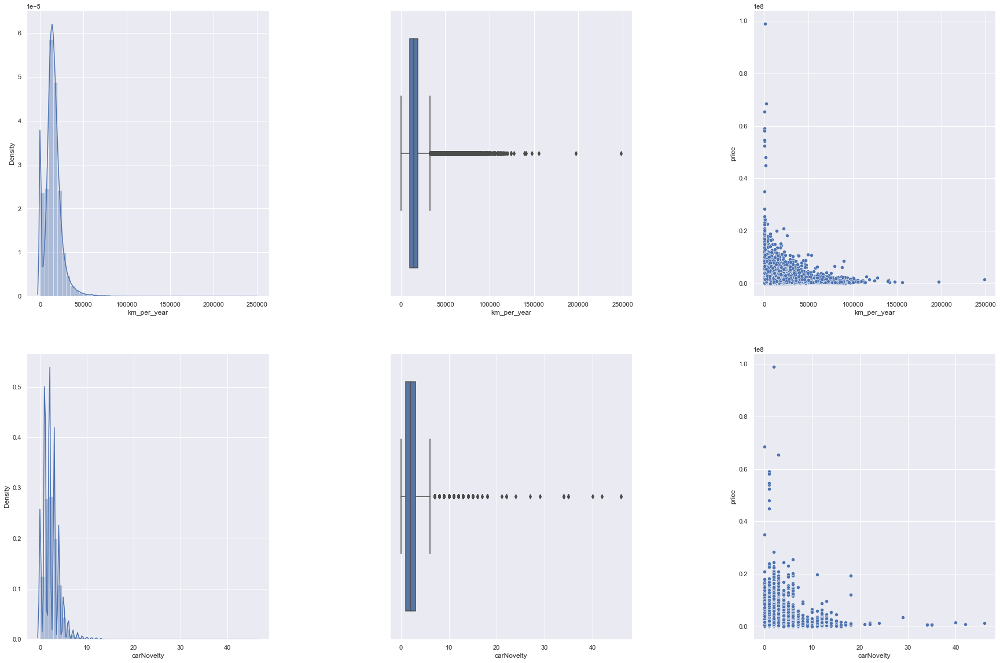

In [208]:
print("Диаграмы распределения новых числовых признаков, взаимосвязь с целевой переменной")

fig, axes = plt.subplots(len(num_cols_new), 3, figsize=(30, 20))
plt.subplots_adjust(wspace=0.5)
axes = axes.flatten()
i = 0

for col in num_cols_new:
    sns.distplot(data[col], ax=axes[i])
    i = i + 1
    sns.boxplot(data[col], ax=axes[i])
    i = i + 1
    sns.scatterplot(data=data[data['train'] == 1],
                    x=col, y="price", ax=axes[i])
    i = i + 1

Графики для переменной  prodDate_3Y


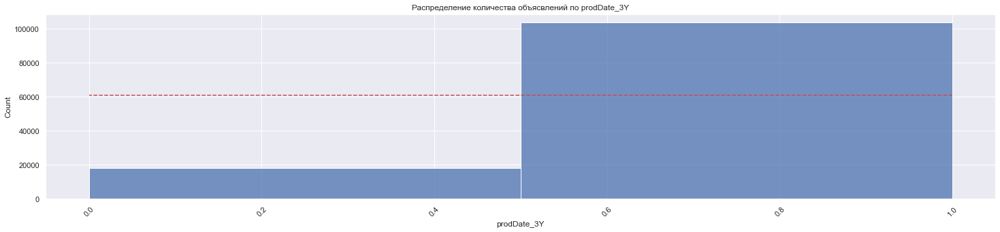

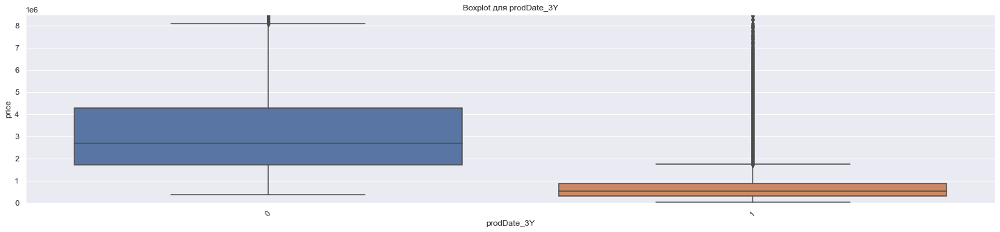



Графики для переменной  prodDate_5Y


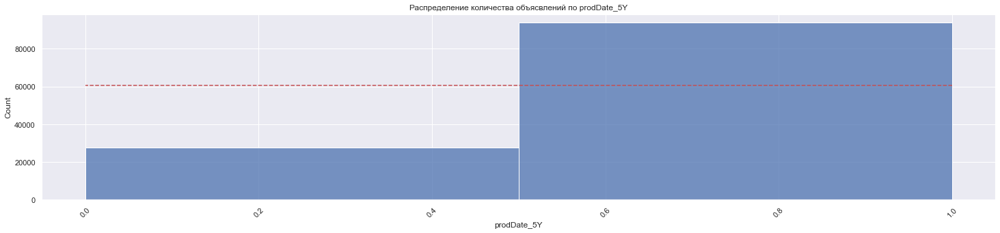

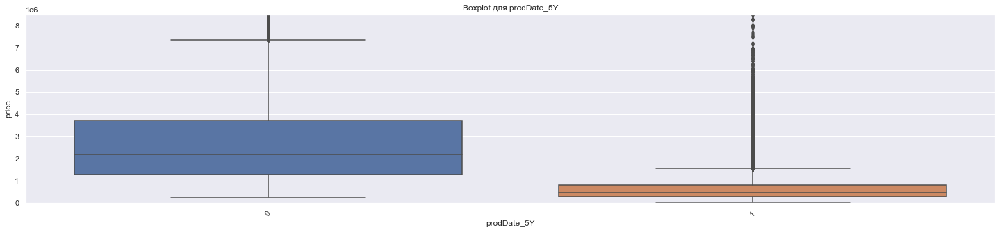



Графики для переменной  ownershipTimeIsNull


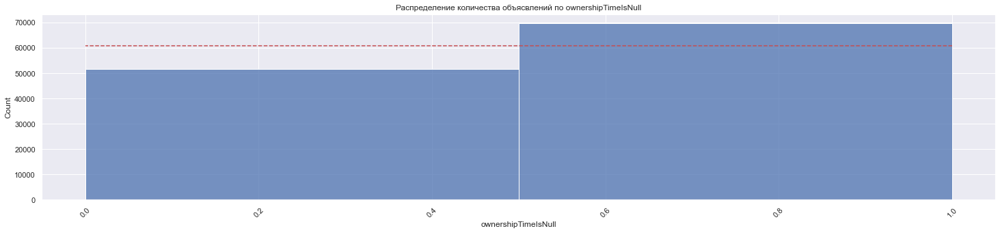

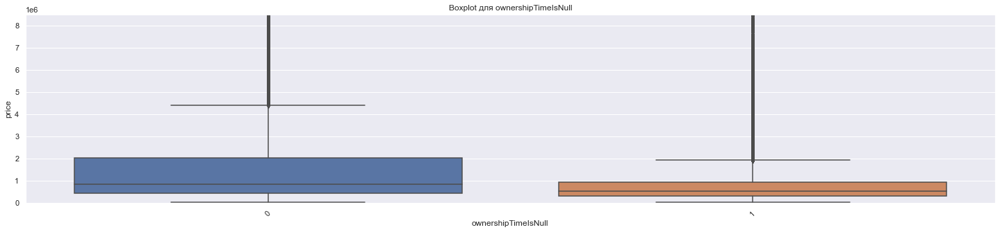



Графики для переменной  descriptionIsNull


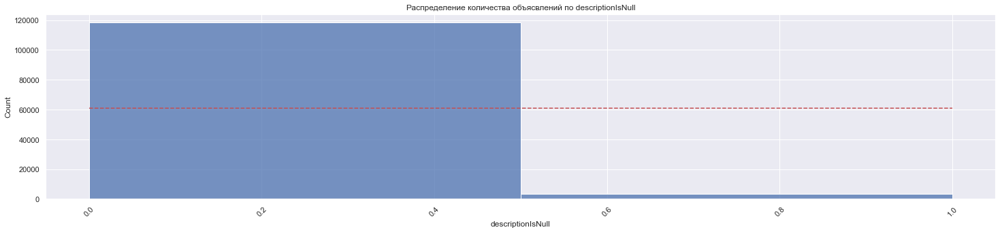

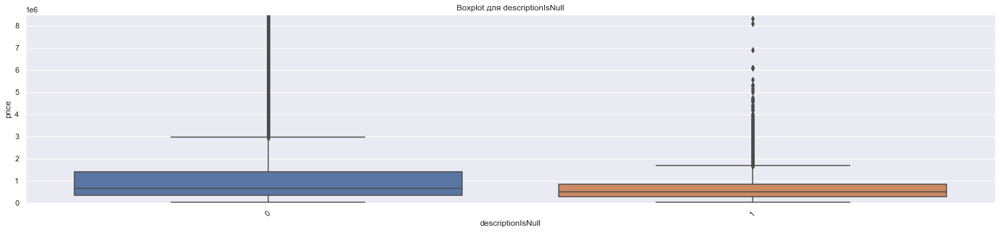



Графики для переменной  newCar


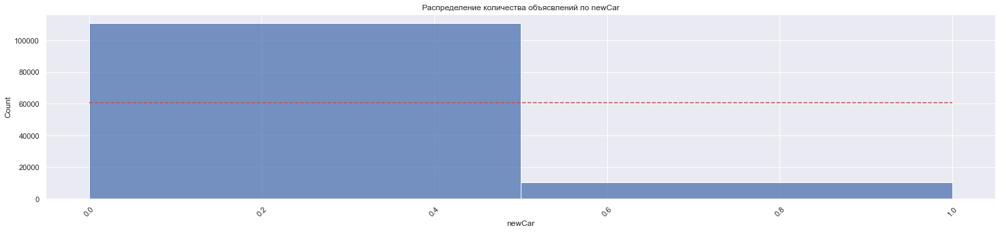

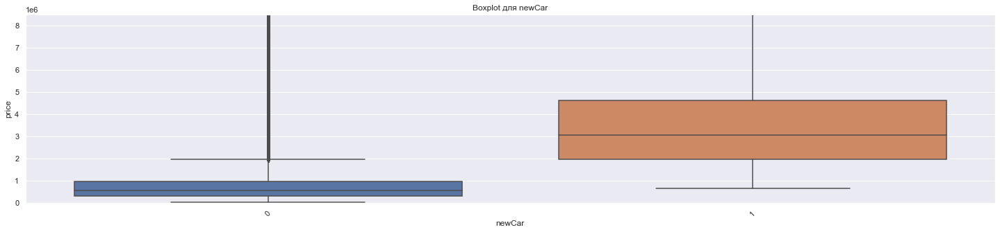



Графики для переменной  brandPopular


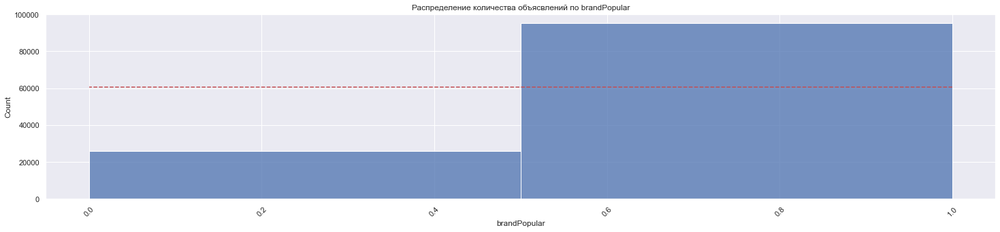

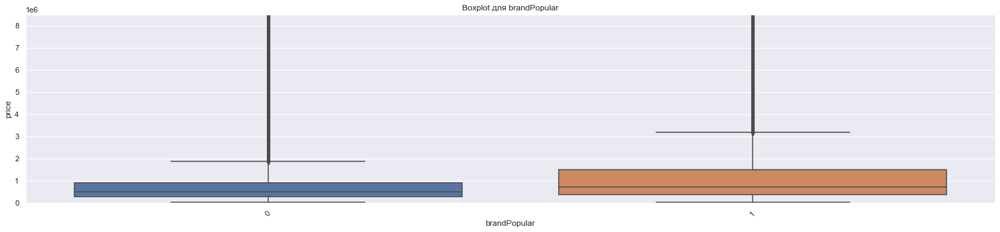



Графики для переменной  modelPopular


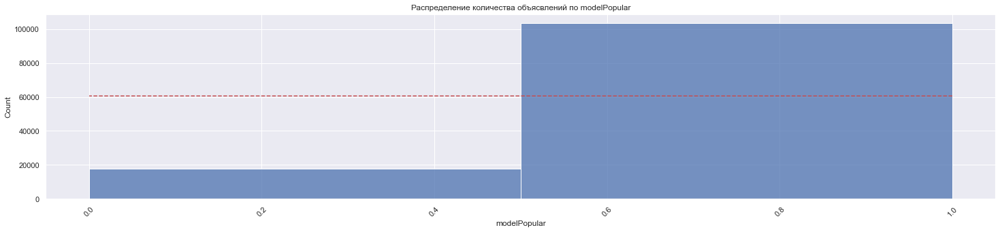

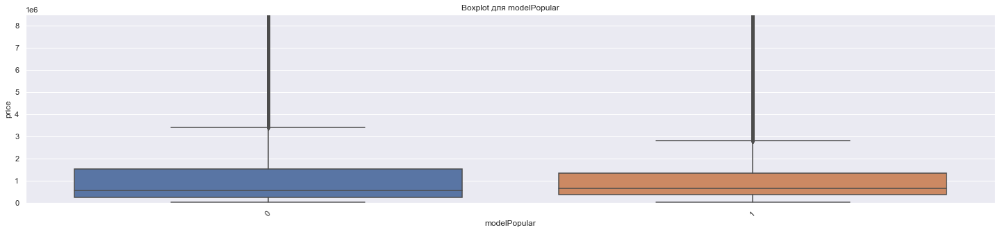

In [209]:
# Посмотрим внимательно на графики еще раз
for col in (bin_cols_new+cat_cols_new):
    print("Графики для переменной ", col)
    analyze_cat_cols(col)
    print("\n")

<a id="3.7"></a>
###  [3.7 Обработка выбросов](#0)


In [210]:
# Проанализируем выбросы для категориальных и номинативных признаков
print("Отчет о наличии выбросов в датасете.\n")
for col in (num_cols + target_col):
    print("\nПризнак: ", col)
    iqr_analysis(data[col])
    print("-" * 100)

Отчет о наличии выбросов в датасете.


Признак:  modelDate

25-й перцентиль: 2004.0, 
75-й перцентиль: 2013.0, 
IQR: 9.0,  
Границы выбросов: [1990.5, 2026.5]. 

Минимальное значение признака: 1904. 
Максимальное значение признака: 2020 .

Найдены выбросы по нижней границе признака! Количество: 3068, 2.53%
----------------------------------------------------------------------------------------------------

Признак:  productionDate

25-й перцентиль: 2007.0, 
75-й перцентиль: 2015.0, 
IQR: 8.0,  
Границы выбросов: [1995.0, 2027.0]. 

Минимальное значение признака: 1904. 
Максимальное значение признака: 2021 .

Найдены выбросы по нижней границе признака! Количество: 3626, 2.98%
----------------------------------------------------------------------------------------------------

Признак:  enginePower

25-й перцентиль: 117.0, 
75-й перцентиль: 211.0, 
IQR: 94.0,  
Границы выбросов: [-24.0, 352.0]. 

Минимальное значение признака: 30.0. 
Максимальное значение признака: 639.0 .

Найдены выбро

Выводы:
1. Оставляем выбросы по признакам modelDate, productionDate, carNovelty - выбросы оставляем, т.к. в test выборке были значения с раратитными авто, которые нужно предсказывать.
2. По остальным выбросам проведем анализ и обработку.

Посмотрим детальнее на признаки, где были найдены выбросы. Сравнить мин/макс границы по test датасету и удалить лишние данные, если их объем не очень большой.

#### enginePower

_Границы выбросов: [-24.0, 352.0]._

_Минимальное значение признака: 30.0. 
Максимальное значение признака: 639.0 ._

_Найдены выбросы по верхней границе признака! Количество: 5633, 4.64%_

In [211]:
# Посмотрим на максимальные значения признака в test
test.enginePower.max()

639.0

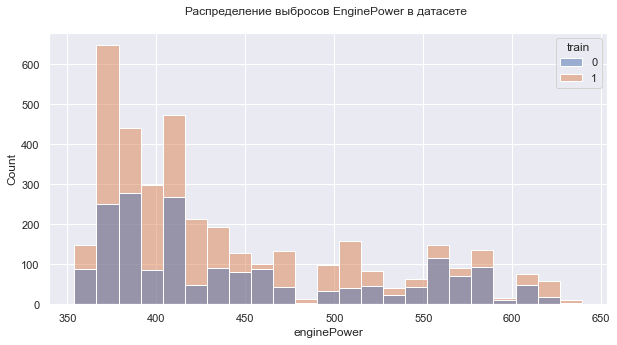

In [212]:
# Посмотрим на распределение выбросов
fig, ax = plt.subplots(figsize=(10, 5))
sns.histplot(data=data[(data.enginePower > 352)], x='enginePower', hue = 'train')
plt.title("Распределение выбросов EnginePower в датасете \n")
plt.show()

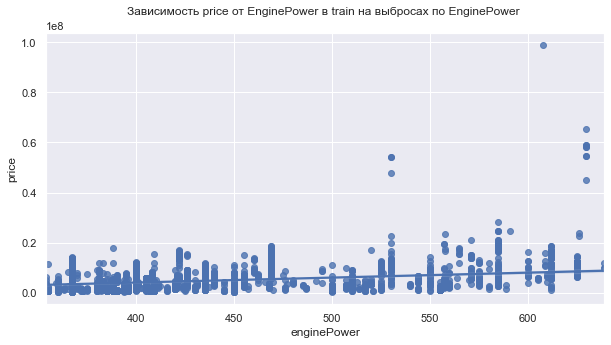

In [213]:
# Посмотрим на распределение выбросов
fig, ax = plt.subplots(figsize=(10, 5))
sns.regplot(data=data[(data.enginePower > 352) & (
    data.train == 1)], x="enginePower", y="price")
plt.title("Зависимость price от EnginePower в train на выбросах по EnginePower \n")
plt.show()

- Выбросы по признаку представлены как в train, так и в test части. Удалять строки нельзя, т.к. необходимо строить предсказания по большим значениям enginePower
- Цена варьтруется и увеличивается с увеличением мощности двигателя, заменять выбросы на другую величину не стоит


#### mileage

_Границы выбросов: [-112500.0, 387500.0]._

_Минимальное значение признака: 0.0. 
Максимальное значение признака: 1000000.0 ._

_Найдены выбросы по верхней границе признака! Количество: 2559, 2.11%_

In [214]:
# Посмотрим на максимальные значения признака в test
test.mileage.max()

1000000

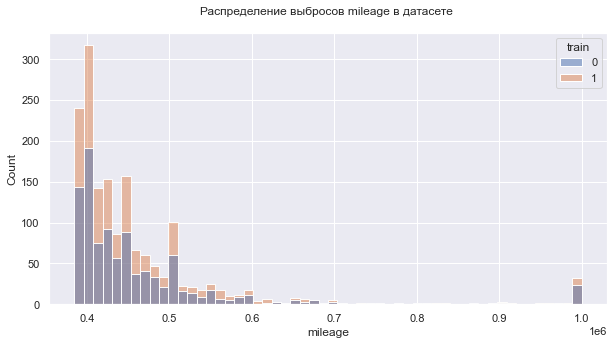

In [215]:
# Посмотрим на распределение выбросов
fig, ax = plt.subplots(figsize=(10, 5))
sns.histplot(data=data[(data.mileage > 385000)], x='mileage', hue = 'train')
plt.title("Распределение выбросов mileage в датасете \n")
plt.show()

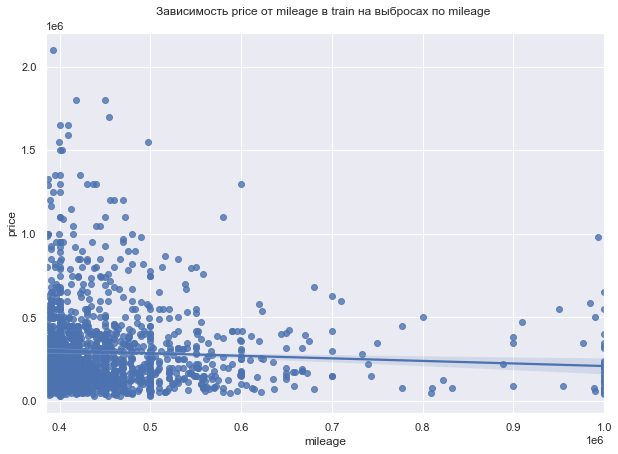

In [216]:
# Посмотрим на распределение выбросов
fig, ax = plt.subplots(figsize=(10, 7))
sns.regplot(data=data[(data.mileage > 385000) & (
    data.train == 1)], x="mileage", y="price")
plt.title("Зависимость price от mileage в train на выбросах по mileage \n")
plt.show()

- Выбросы по признаку представлены как в train, так и в test части. Удалять строки нельзя, т.к. необходимо строить предсказания по большим значениям mileage
- Цена варьтруется и снижается с увеличением пробега, но есть и увеличение цены на макимальных значениях пробега (раритетные авто?), заменять выбросы на другую величину не стоит


#### engineDisplacement 

Признак позднее исключается из анализа.

_Границы выбросов: [0.2500000000000002, 3.8499999999999996]._

_Минимальное значение признака: 0.0. 
Максимальное значение признака: 8.4._

_Найдены выбросы по нижней границе признака! Количество: 2, 0.0%_

_Найдены выбросы по верхней границе признака! Количество: 8407, 6.93%_

In [217]:
# Посмотрим на максимальные значения признака в test
print("Максимальное значение engineDisplacement  в test:", test.engineDisplacement.max())
# Посмотрим на минимальное значения признака в test
print("Минимальное значение engineDisplacement  в test:", test.engineDisplacement.min())

Максимальное значение engineDisplacement  в test: 6.6
Минимальное значение engineDisplacement  в test: 0.7


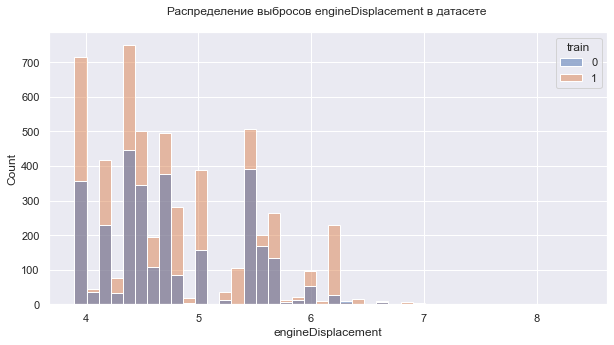

In [218]:
# Посмотрим на распределение выбросов
fig, ax = plt.subplots(figsize=(10, 5))
sns.histplot(data=data[(data.engineDisplacement > 3.85)], x='engineDisplacement', hue = 'train')
plt.title("Распределение выбросов engineDisplacement в датасете \n")
plt.show()

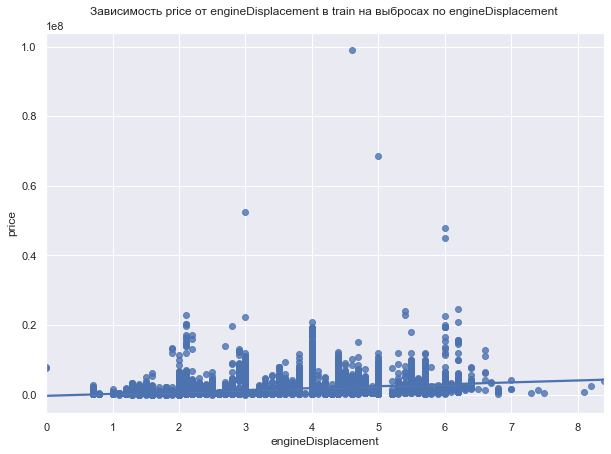

In [219]:
# Посмотрим на распределение выбросов
fig, ax = plt.subplots(figsize=(10, 7))
sns.regplot(data=data[(data.mileage > 3.85) & (
    data.train == 1)], x="engineDisplacement", y="price")
plt.title("Зависимость price от engineDisplacement в train на выбросах по engineDisplacement \n")
plt.show()

In [220]:
# Посмотрим на записи, которые привышают максимальный порог test-а
data[(data.engineDisplacement > 6.6)].describe()

,modelDate,productionDate,engineDisplacement,enginePower,mileage,driveSide,condition,ownersCount,tcp,customs,...,price_log,km_per_year,carNovelty,prodDate_3Y,prodDate_5Y,ownershipTimeIsNull,descriptionIsNull,newCar,brandPopular,modelPopular
count,17.000000,17.000000,17.000000,17.000000,17.000000,17.0,17.0,17.000000,17.000000,17.0,...,17.000000,17.000000,17.000000,17.0,17.0,17.000000,17.0,17.0,17.000000,17.000000
mean,1988.941176,1992.294118,7.182353,332.764706,140117.588235,0.0,0.0,2.352941,0.823529,0.0,...,14.109774,6943.640369,3.352941,1.0,1.0,0.411765,0.0,0.0,0.705882,0.058824
std,17.209992,17.434752,0.557040,95.387715,130645.475654,0.0,0.0,0.785905,0.392953,0.0,...,0.812784,6567.466048,2.262222,0.0,0.0,0.507300,0.0,0.0,0.469668,0.242536
min,1956.000000,1961.000000,6.700000,215.000000,1000.000000,0.0,0.0,1.000000,0.000000,0.0,...,12.429216,22.727273,0.000000,1.0,1.0,0.000000,0.0,0.0,0.000000,0.000000
25%,1972.000000,1976.000000,6.800000,313.000000,65000.000000,0.0,0.0,2.000000,1.000000,0.0,...,13.458836,1186.440678,2.000000,1.0,1.0,0.000000,0.0,0.0,0.000000,0.000000
50%,1999.000000,1999.000000,7.000000,314.000000,78000.000000,0.0,0.0,3.000000,1.000000,0.0,...,14.266586,4444.444444,4.000000,1.0,1.0,0.000000,0.0,0.0,1.000000,0.000000
75%,1999.000000,2004.000000,7.400000,345.000000,230000.000000,0.0,0.0,3.000000,1.000000,0.0,...,14.771022,10952.380952,5.000000,1.0,1.0,1.000000,0.0,0.0,1.000000,0.000000
max,2008.000000,2013.000000,8.400000,600.000000,403000.000000,0.0,0.0,3.000000,1.000000,0.0,...,15.226498,18000.000000,7.000000,1.0,1.0,1.000000,0.0,0.0,1.000000,1.000000


#### price

_Границы выбросов: [-1417500.0, 2362500.0]._

_Минимальное значение признака: 0.0._ 
_Максимальное значение признака: 99000000.0._

_Найдены выбросы по верхней границе признака! Количество: 11649, 9.59%_

Проанализировать, но вообще, log значение выбросы не содержит, а мы его используем в моделях.

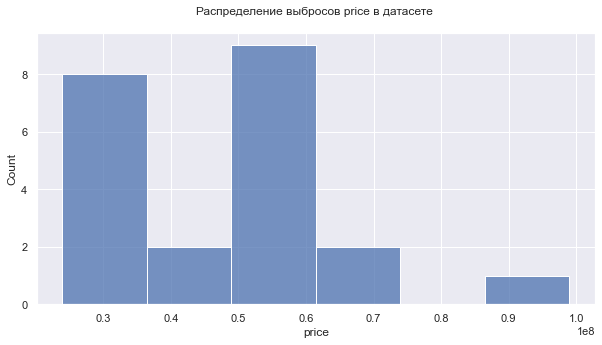

In [222]:
# Посмотрим на распределение выбросов
fig, ax = plt.subplots(figsize=(10, 5))
sns.histplot(data=data[(data.price > 23362500)&(data.train == 1)], x='price')
plt.title("Распределение выбросов price в датасете \n")
plt.show()

In [223]:
data[(data.price > 23362500)&(data.train == 1)].describe(include=object)

,bodyType,brand,color,fuelType,name,numberOfDoors,vehicleConfiguration,vehicleTransmission,description,drivetrain,ownershipTime,model,vendor
count,22,22,22,22,22,22,22,22,22,22,22,22,22
unique,5,2,5,3,10,3,10,3,22,2,4,9,1
top,седан,MERCEDES,чёрный,бензин,650 6.0 AT (630 л.с.),4,SEDAN AUTOMATIC 650,автоматическая,Продажа от Юр. лица\nЦена с НДС,задний,no_data,S_CLASS_MAYBACH,EUROPEAN
freq,13,21,13,20,8,13,8,18,1,17,19,11,22


In [224]:
# Посмотрим, какие машины имеют особо высокие цены
data[(data.price > 23362500)&(data.train == 1)].groupby(['brand', 'model'])['price'].agg(['count', 'max'])
# Добавим список моделей в список
models_list = data[(data.price > 23362500)&(data.train == 1)].model.values

In [225]:
# Вспомним, сколько авто таких моделей присутствует в тесте
data[(data.model.isin(models_list)) & (data.train == 0)].groupby(
    ['brand', 'model'])['model'].count()

brand     model          
MERCEDES  G_KLASSE_AMG        69
          SLR_KLASSE           1
          SLS_AMG              4
          S_CLASS_MAYBACH     53
          S_KLASSE           549
          V_KLASSE            74
          W136                 1
          W188                 1
Name: model, dtype: int64

Вывод: есть очень дорогие авто, которые представлены и в тестовой выборке.

Самый дорогой автомобиль - PORSCHE	918_SPYDER, бренд PORSCHE в тестовой выборке отсутствует, удалим этот выброс.

In [226]:
#Удаляем строку

data.drop([data[data.model == '918_SPYDER'].index[0]], inplace=True)

**Логарифмирование числовых признаков**

Поскольку многие числовые переменные имеют смещенное распределение влево/вправо попробуем логарифмировать часть признаков.

In [227]:
cols_to_log = ['enginePower', 'mileage', 'engineDisplacement']
# Применим логарифмирование ко всем числовым признакам
for col in cols_to_log:
    data[col] = data[col].apply(lambda w: np.log(w+1))

Диаграмы распределения числовых признаков после логарифмирования.


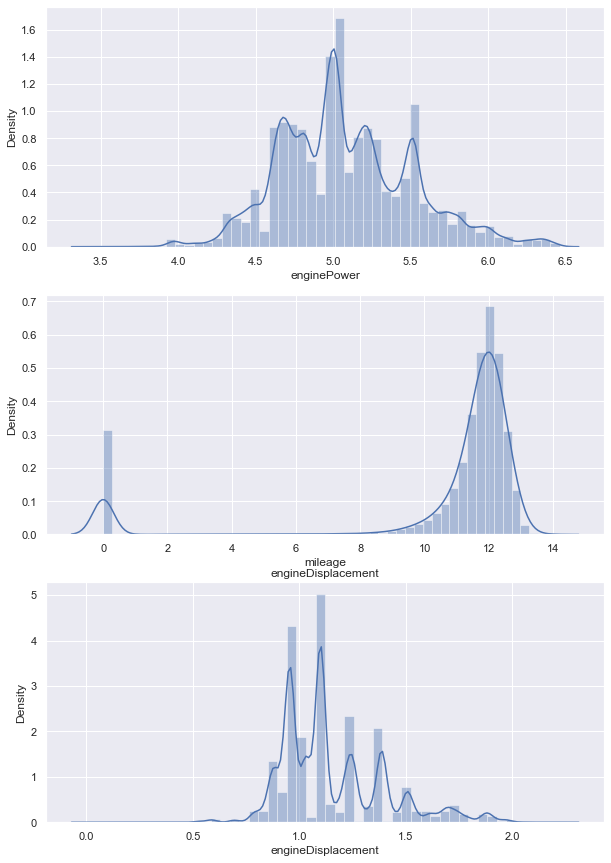

In [228]:
# Посмотрим, как изменилось распределение
print("Диаграмы распределения числовых признаков после логарифмирования.")
fig, axes = plt.subplots(len(cols_to_log), figsize=(10, 15))
axes = axes.flatten()
i = 0

for col in cols_to_log:
    sns.distplot(data[col], ax=axes[i])
    plt.title(col)
    i = i + 1

Вывод: логарифмирование позволило привести признаки к более нормальному распределению. Оставим в таком виде.

###  <a id="3.8"></a> 3.8 Отбор признаков для моделирования

#### Корреляционный анализ числовых признаков

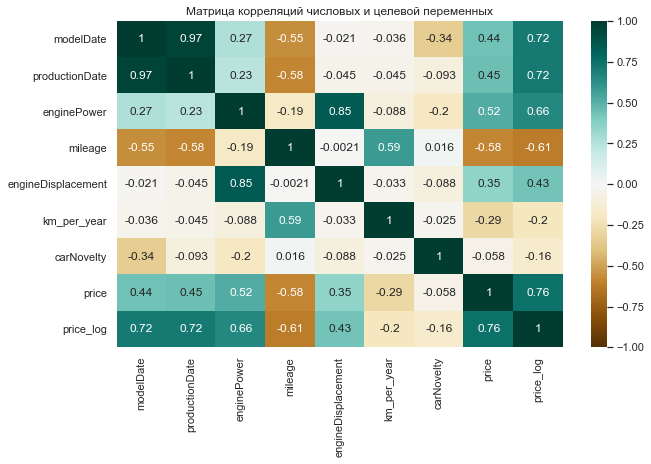

In [229]:
# Построим матрицу корреляций
plt.figure(figsize=(10, 6))
heatmap = sns.heatmap(data[data['train'] == 1][num_cols +
                                               target_col].corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Матрица корреляций числовых и целевой переменных')
plt.show()

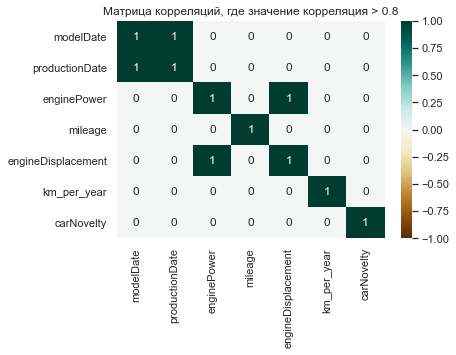

In [230]:
# Подсветим те значения, где коэффициент корреляции больше заданного порога
plt.figure(figsize=(6, 4))
heatmap = sns.heatmap(abs(data[data['train'] == 1][num_cols].corr(
)) > 0.8, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Матрица корреляций, где значение корреляция > 0.8')
plt.show()

Сформируем список признаков, которые коллинеарны. Для этого выставим критерий наличия корреляции больше 0.8 или -0.8.

In [231]:
# Сформируем сет со скоррелированными признаками
correlated_features = set()

# Удаляем целевые и служебные переменные из матрицы коррелиций, тк корреляция с ней, - хорошо для модели
correlation_matrix = data[data['train'] == 1][num_cols].corr()

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.8:
            colname = correlation_matrix.columns[j]
            correlated_features.add(colname)

print('Список скоррелированных признаков на удаление из обучения модели:',
      correlated_features)

Список скоррелированных признаков на удаление из обучения модели: {'enginePower', 'modelDate'}


Вывод: найдены сильно скоррелированные признаки, но мы это уже видели во время анализа ранее и добавили признаки в список на исключение.

#### Удаление признаков перед моделированием

In [232]:
# Удаляем признаки из датасета, которые решили удалить по ходу анализа
data.drop(cols_removal, axis=1, inplace=True)

In [233]:
# Смотрим, какие признаки остались
print("После обработки остались следующие признаки:", data.columns)

После обработки остались следующие признаки: Index(['bodyType', 'brand', 'color', 'fuelType', 'numberOfDoors',
       'productionDate', 'vehicleTransmission', 'enginePower', 'mileage',
       'drivetrain', 'driveSide', 'ownersCount', 'tcp', 'price', 'model',
       'vendor', 'train', 'sell_id', 'transmission', 'price_log',
       'km_per_year', 'carNovelty', 'prodDate_3Y', 'prodDate_5Y',
       'ownershipTimeIsNull', 'descriptionIsNull', 'newCar', 'brandPopular',
       'modelPopular'],
      dtype='object')


**Кодирование категориальных признаков**

#### Label Encoding

In [237]:
# Labels encoding for all
cols_to_encode = list(set(data.columns) & set(cat_cols))
for colum in cols_to_encode:
    data[colum] = data[colum].astype('category').cat.codes

####  Поиск статистически значимых различий с помощью теста Стьюдента


In [240]:
# Создадим список с колонками, которые удалим из данных ввиду их статистической незначимости
cat_cols_remove = []

# Проходим по колонкам, которые исключали из корреляционного анализа
for column in (list(set(data.columns).difference(num_cols+service_cols+target_col))):
    #print("\n\nПроверяется колонка:", column)
    cat_cols_remove.append(get_stat_dif(column))

Не найдены статистически значимые различия для колонки и комбинации bodyType (10, 5)
Не найдены статистически значимые различия для колонки и комбинации brand (21, 27)
Не найдены статистически значимые различия для колонки и комбинации color (15, 8)
Не найдены статистически значимые различия для колонки и комбинации fuelType (0, 1)
Не найдены статистически значимые различия для колонки и комбинации model (761, 792)
Не найдены статистически значимые различия для колонки и комбинации numberOfDoors (4, 0)


Вывод: присутсвуют признаки, для которых, не все значения категорий влияют на целевую переменную

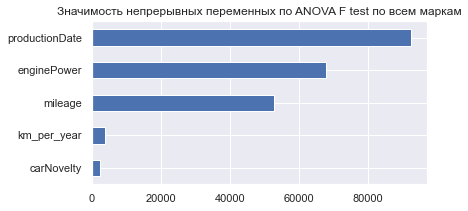

In [242]:
#Оценим значимость числовых признаков
fig, ax = plt.subplots(figsize=(6, 3))
anova_df = data[data['train'] == 1].dropna().copy()
imp_num = pd.Series(f_regression(anova_df[list(set(data.columns) & set(num_cols))], anova_df['price_log'])[
                    0], index=list(set(data.columns) & set(num_cols)))
imp_num.sort_values(inplace=True)
imp_num.plot(
    kind='barh', title='Значимость непрерывных переменных по ANOVA F test по всем маркам')
plt.show()

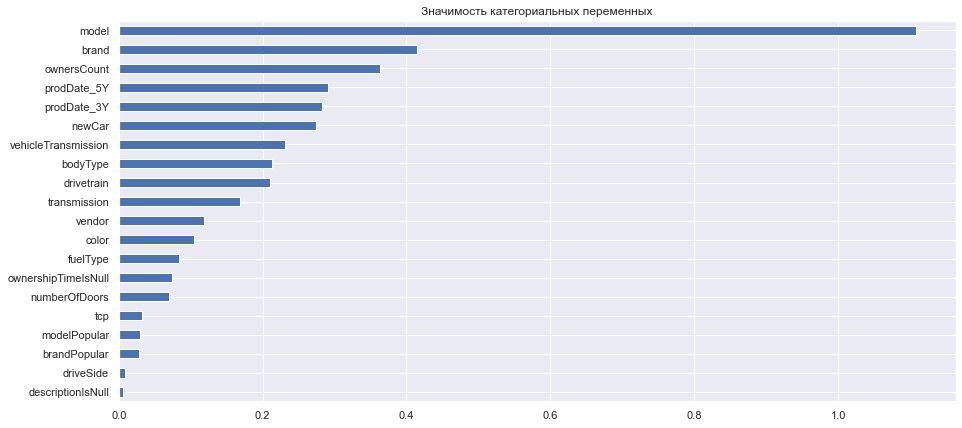

In [243]:
# Оценим значимость бинарных и категориальных признаков
fig, ax = plt.subplots(figsize=(15, 7))

anova_df = data[data['train'] == 1].dropna().copy()

# Labels encoding
cols_to_encode = list(set(anova_df.columns) & set(cat_cols))
for colum in cols_to_encode:
    anova_df[colum] = anova_df[colum].astype('category').cat.codes

imp_cat = pd.Series(mutual_info_regression(
    anova_df[list(set(data.columns) & set(bin_cols+cat_cols))], anova_df['price'], discrete_features=True), index=list(set(data.columns) & set(bin_cols+cat_cols)))
imp_cat.sort_values(inplace=True)
imp_cat.plot(kind='barh', title='Значимость категориальных переменных')
plt.show()

<a id="4"></a>
##  [4. Предварительный анализ ML](#0)

**Стандартизация числовых признаков**

In [244]:
# Стандартизация числовых переменных
cols_to_scale = list(set(data.columns) & set(num_cols))
data[cols_to_scale] = StandardScaler().fit_transform(data[cols_to_scale].values)

####   Выделим тестовую и тренировочную части

In [245]:
X = data.query('train == 1').drop(
    ['train', 'price', 'price_log'], axis=1)
X_sub = data.query('train == 0').drop(
    ['train', 'price', 'price_log'], axis=1)

In [246]:
# В качестве y указываем обычную цену
y = data[data.train == 1]['price']

#### Train Split

In [247]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=VAL_SIZE, shuffle=True, random_state=RANDOM_SEED)

<a id="5"></a>
# [5.Модель №1. Наивная модель](#0)
Эта модель будет предсказывать среднюю цену по модели двигателя (`mileage`). 
C ней будем сравнивать другие модели.

In [248]:
tmp_train = X_train.copy()
tmp_train['price'] = y_train

In [249]:
# Находим median по экземплярам mileage в трейне и размечаем тест
predict = X_test['mileage'].map(
    tmp_train.groupby('mileage')['price'].median())

# оцениваем точность
print(
    f"Точность наивной модели по метрике MAPE: {(mape(y_test, predict.values))*100:0.2f}%")

Точность наивной модели по метрике MAPE: 76.64%


<a id="6"></a> 
# [6. Модель №2: CatBoost](#0)

In [250]:
model = CatBoostRegressor(iterations = 5000,
                          random_seed = RANDOM_SEED,
                          eval_metric='MAPE',
                          custom_metric=['R2', 'MAE'],
                          silent=True,
                         )
model.fit(X_train, y_train,
         #cat_features=cat_features_ids,
         eval_set=(X_test, y_test),
         verbose_eval=0,
         use_best_model=True,
         #plot=True
         )

model.save_model('catboost_single_model_baseline.model')

In [251]:
# оцениваем точность
predict = model.predict(X_test)
print(f"Точность модели по метрике MAPE: {(mape(y_test, predict))*100:0.2f}%")

Точность модели по метрике MAPE: 15.07%


#### Log Traget

In [252]:
np.log(y_train)

32647    12.899220
19678    13.451667
64980    14.148405
69189    16.300417
76204    13.454541
           ...    
6714     14.316286
57557    13.514405
80397    13.937728
920      12.429216
16593    12.043554
Name: price, Length: 69452, dtype: float64

In [253]:
model = CatBoostRegressor(iterations=5000,
                          random_seed=RANDOM_SEED,
                          eval_metric='MAPE',
                          custom_metric=['R2', 'MAE'],
                          silent=True,
                          )
model.fit(X_train, np.log(y_train),
          # cat_features=cat_features_ids,
          eval_set=(X_test, np.log(y_test)),
          verbose_eval=0,
          use_best_model=True,
          # plot=True
          )

model.save_model('catboost_single_model_2_baseline.model')

In [254]:
predict_test = np.exp(model.predict(X_test))

In [255]:
print(
    f"Точность модели по метрике MAPE: {(mape(y_test, predict_test))*100:0.2f}%")

Точность модели по метрике MAPE: 12.74%


<a id="7"></a>
# [7. Модель 3: RandomForestRegressor](#0)

In [256]:
# Построим модель на дефолтных параметрах
# без логарифмирования целевой переменной
rf = RandomForestRegressor(random_state = RANDOM_SEED)
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_test)

print(
    f"Точность модели по метрике MAPE без логтаргета: {(mape(y_test, rf_pred))*100:0.2f}%")

# с логарифмированием целевой переменной
rf_log = RandomForestRegressor(random_state = RANDOM_SEED)
rf_log.fit(X_train, np.log(y_train))
rf_log_pred = np.exp(rf_log.predict(X_test))

print(
    f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, rf_log_pred))*100:0.2f}%")


Точность модели по метрике MAPE без логтаргета: 14.97%
Точность модели по метрике MAPE с логтаргетом: 13.40%


In [257]:
# Попробуем подобрать гиперпараметры для нашей модели

random_grid = {'n_estimators': [int(x) for x in np.linspace(start=100, stop=400, num=4)],
               'max_features': ['auto', 'sqrt', 'log2'],
               'max_depth': [int(x) for x in np.linspace(5, 15, num=6)] + [None],
               'min_samples_split': [2, 5, 10],
               'min_samples_leaf': [1, 2, 4],
               'bootstrap': [True, False]}

rfr = RandomForestRegressor(random_state=RANDOM_SEED)
rf_random = RandomizedSearchCV(estimator=rfr, param_distributions=random_grid,
                               n_iter=100, cv=3, verbose=10, random_state=RANDOM_SEED, n_jobs=-1)

rf_random.fit(X_train, np.log(y_train))
rf_random.best_params_

Fitting 3 folds for each of 100 candidates, totalling 300 fits


{'n_estimators': 300,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': None,
 'bootstrap': True}

In [258]:
# Обучим модель на лучших гиперпараметрах

#best_rfr = rf_random.best_estimator_
best_rfr = RandomForestRegressor(random_state=RANDOM_SEED
                      , n_estimators=300
                      , min_samples_split=2
                      , min_samples_leaf=1
                      , max_features='auto'
                      , max_depth=None
                      , bootstrap=True)

# best_rfr.fit(X_train, y_train)
best_rfr.fit(X_train, np.log(y_train))

# predict_rfr = best_rfr.predict(X_test)
predict_rfr = np.exp(best_rfr.predict(X_test))
print(
    f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, predict_rfr))*100:0.2f}%")

Точность модели по метрике MAPE с логтаргетом: 13.35%


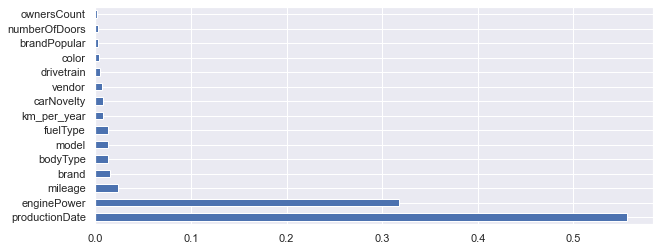

In [259]:
# в RandomForestRegressor есть возможность вывести самые важные признаки для модели
plt.rcParams['figure.figsize'] = (10,4)
feat_importances = pd.Series(best_rfr.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh');

 <a id="8"></a>
# [8. Модель 4: XGBRegressor](#0)

In [260]:
# можно попробовать менять learning_rate (0.05, 0.03, 0.01), max_depth (3,5,8,12,24,36)

# без логарифмирования целевой переменной
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.5,
                          learning_rate=0.05, max_depth=12, alpha=1,
                          n_estimators=1000)
xgb_reg.fit(X_train, y_train)
print(
    f"Точность модели по метрике MAPE без логтаргета: {(mape(y_test, xgb_reg.predict(X_test)))*100:0.2f}%")

#с логарифмированием целевой переменной
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.5,
                          learning_rate=0.05, max_depth=12, alpha=1,
                          n_estimators=1000)
xgb_reg.fit(X_train, np.log(y_train))
print(
    f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, np.exp(xgb_reg.predict(X_test))))*100:0.2f}%")

Точность модели по метрике MAPE без логтаргета: 14.62%
Точность модели по метрике MAPE с логтаргетом: 12.69%


Попробуем с логарифмом таргета разную глубину

In [261]:
#Попробуем с логарифмом таргета разную глубину

def xgb_reg_learn(depth):
    xgb_list = []
    for i in depth:
        xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.5,
                                        learning_rate=0.05, max_depth=i, alpha=1,
                                        n_estimators=1000)
        xgb_reg.fit(X_train, np.log(y_train))
        xgb_list.append(xgb_reg)
        print(
            f"Точность модели по метрике MAPE с логтаргетом и max_depth={i}: {(mape(y_test, np.exp(xgb_reg.predict(X_test))))*100:0.2f}%")
    return xgb_list

depth = [3,5,8,12,24,36]
xgb_list = xgb_reg_learn(depth)



Точность модели по метрике MAPE с логтаргетом и max_depth=3: 15.56%
Точность модели по метрике MAPE с логтаргетом и max_depth=5: 13.52%
Точность модели по метрике MAPE с логтаргетом и max_depth=8: 12.63%
Точность модели по метрике MAPE с логтаргетом и max_depth=12: 12.69%
Точность модели по метрике MAPE с логтаргетом и max_depth=24: 12.83%
Точность модели по метрике MAPE с логтаргетом и max_depth=36: 12.81%


In [278]:
# Параметры лучшей модели
best_xgb = xgb_list[2]
best_xgb


XGBRegressor(alpha=1, base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.5, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=8,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=1, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

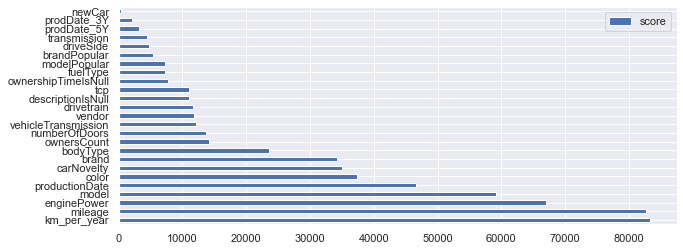

In [263]:
feature_important = best_xgb.get_booster().get_score(importance_type='weight')
keys = list(feature_important.keys())
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.plot(kind='barh');

<a id="9"></a>
# [9. Модель 5: ExtraTreesRegressor](#0)

In [264]:
#Построим модель на дефолтных параметрах

# без логарифмирования целевой переменной
etr = ExtraTreesRegressor(random_state = RANDOM_SEED)
etr.fit(X_train, y_train)
etr_pred = etr.predict(X_test)

print(
    f"Точность модели по метрике MAPE без логтаргета: {(mape(y_test, etr_pred))*100:0.2f}%")

# с логарифмированием целевой переменной
etr = ExtraTreesRegressor(random_state = RANDOM_SEED)
etr.fit(X_train, np.log(y_train))
etr_pred = np.exp(etr.predict(X_test))

print(
    f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, etr_pred))*100:0.2f}%")

Точность модели по метрике MAPE без логтаргета: 15.03%
Точность модели по метрике MAPE с логтаргетом: 13.63%


In [265]:
# Попробуем подобрать гиперпараметры для нашей модели

random_grid = {'n_estimators': [int(x) for x in np.linspace(start = 100, stop = 400, num = 4)],
               'max_features': ['auto', 'sqrt','log2'],
               'max_depth': [int(x) for x in np.linspace(5, 15, num = 6)] + [None],
               'min_samples_split': [2, 5, 10],
               'min_samples_leaf': [1, 2, 4],
               'bootstrap': [True, False]}

etr = ExtraTreesRegressor(random_state = RANDOM_SEED)
etr_random = RandomizedSearchCV(estimator = etr, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=10, random_state=RANDOM_SEED, n_jobs = -1)
# rf_random.fit(X_train, y_train)
etr_random.fit(X_train, np.log(y_train))
etr_random.best_params_

Fitting 3 folds for each of 100 candidates, totalling 300 fits


{'n_estimators': 300,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': None,
 'bootstrap': True}

In [271]:
# Обучим модель на лучших гиперпараметрах

best_etr = ExtraTreesRegressor(random_state=RANDOM_SEED,
                               n_estimators=300,
                               min_samples_split=2,
                               min_samples_leaf=1,
                               max_features='auto',
                               max_depth=None,
                               bootstrap=True)
best_etr.fit(X_train, np.log(y_train))

predict_etr = np.exp(best_etr.predict(X_test))

print(
    f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, predict_etr))*100:0.2f}%")

Точность модели по метрике MAPE с логтаргетом: 13.27%


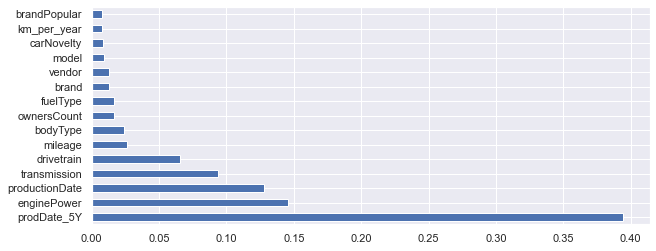

In [272]:
plt.rcParams['figure.figsize'] = (10,4)
feat_importances = pd.Series(best_etr.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh');

<a id="10"></a>
# [10. Модель 6: BaggingRegressor](#0)

## 10.1. с RandomForest

In [273]:
#best_rfr
RandomForestRegressor(n_estimators=300, random_state=42)

RandomForestRegressor(n_estimators=300, random_state=42)

In [274]:
# Обучим на дефолтных параметрах

bagg_rfr_d = BaggingRegressor(best_rfr, n_jobs=1, random_state=RANDOM_SEED)
bagg_rfr_d.fit(X_train, np.log(y_train))
predict_bagg_rfr_d = np.exp(bagg_rfr_d.predict(X_test))
print(
    f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, predict_bagg_rfr_d))*100:0.2f}%")


Точность модели по метрике MAPE с логтаргетом: 13.35%


In [275]:
# Добавим к параметрам n_estimators=3

bagg_rfr = BaggingRegressor(best_rfr, n_estimators=3, n_jobs=1, random_state=RANDOM_SEED)
bagg_rfr.fit(X_train, np.log(y_train))
predict_bagg_rfr = np.exp(bagg_rfr.predict(X_test))
print(
    f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, predict_bagg_rfr))*100:0.2f}%")

Точность модели по метрике MAPE с логтаргетом: 13.55%


## 10.2. с ExtraTreesRegressor

In [281]:
# etr
ExtraTreesRegressor(random_state=42)

ExtraTreesRegressor(random_state=42)

In [282]:
# Обучим на дефолтных параметрах

bagg_etr = BaggingRegressor(etr, n_jobs=1, random_state=RANDOM_SEED)
bagg_etr.fit(X_train, np.log(y_train))
predict_bagg_etr = np.exp(bagg_etr.predict(X_test))
print(
    f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, predict_bagg_etr))*100:0.2f}%")



Точность модели по метрике MAPE с логтаргетом: 13.30%


In [283]:
# Добавим к параметрам n_estimators=3

bagg_etr = BaggingRegressor(etr, n_jobs=1, n_estimators = 3, random_state=RANDOM_SEED)
bagg_etr.fit(X_train, np.log(y_train))
predict_bagg_etr = np.exp(bagg_etr.predict(X_test))
print(
    f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, predict_bagg_etr))*100:0.2f}%")



Точность модели по метрике MAPE с логтаргетом: 13.51%


<a id="11"></a>
# [11. Модель 7. StackingRegressor](#0)

### 11.1 Xgboosting, ExtraTreesRegressor+LinearRegression

In [286]:
estimators = [('etr',ExtraTreesRegressor()),
              ('xgb_reg',xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.5, learning_rate=0.05, \
                      max_depth=12, alpha=1, n_jobs=-1, n_estimators=1000))]

st_ensemble = StackingRegressor(estimators=estimators,final_estimator=LinearRegression())

# оцениваем точность
st_ensemble.fit(X_train, np.log(y_train))
predict_e = np.exp(st_ensemble.predict(X_test))
print(f"Точность модели по метрике MAPE: {(mape(y_test, predict_e))*100:0.2f}%")



Точность модели по метрике MAPE: 12.62%


### 11.2 Xgboosting, ExtraTreesRegressor+CatBoostRegressor

In [287]:
estimators = [('etr',ExtraTreesRegressor()),
              ('xgb_reg',xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.5, learning_rate=0.05, \
                      max_depth=12, alpha=1, n_jobs=-1, n_estimators=1000))]

st_ensemble = StackingRegressor(estimators=estimators,final_estimator=CatBoostRegressor())

# оцениваем точность
st_ensemble.fit(X_train, np.log(y_train))
predict_e = np.exp(st_ensemble.predict(X_test))
print(f"Точность модели по метрике MAPE: {(mape(y_test, predict_e))*100:0.2f}%")


Learning rate set to 0.083027
0:	learn: 0.9614212	total: 20ms	remaining: 19.9s
1:	learn: 0.8893493	total: 26.7ms	remaining: 13.3s
2:	learn: 0.8225285	total: 33.2ms	remaining: 11s
3:	learn: 0.7618569	total: 39.7ms	remaining: 9.89s
4:	learn: 0.7068194	total: 46.4ms	remaining: 9.22s
5:	learn: 0.6561247	total: 52.8ms	remaining: 8.75s
6:	learn: 0.6097149	total: 59.1ms	remaining: 8.39s
7:	learn: 0.5673736	total: 65.5ms	remaining: 8.12s
8:	learn: 0.5285721	total: 71.5ms	remaining: 7.88s
9:	learn: 0.4931959	total: 77.6ms	remaining: 7.68s
10:	learn: 0.4610969	total: 83.9ms	remaining: 7.54s
11:	learn: 0.4321349	total: 90.2ms	remaining: 7.43s
12:	learn: 0.4060428	total: 96.8ms	remaining: 7.35s
13:	learn: 0.3821266	total: 103ms	remaining: 7.27s
14:	learn: 0.3607277	total: 110ms	remaining: 7.21s
15:	learn: 0.3415364	total: 116ms	remaining: 7.13s
16:	learn: 0.3242388	total: 123ms	remaining: 7.09s
17:	learn: 0.3087513	total: 129ms	remaining: 7.03s
18:	learn: 0.2950657	total: 135ms	remaining: 6.98s
19

160:	learn: 0.1930864	total: 1.03s	remaining: 5.4s
161:	learn: 0.1930621	total: 1.06s	remaining: 5.51s
162:	learn: 0.1930508	total: 1.08s	remaining: 5.53s
163:	learn: 0.1930323	total: 1.09s	remaining: 5.54s
164:	learn: 0.1930079	total: 1.09s	remaining: 5.54s
165:	learn: 0.1929913	total: 1.11s	remaining: 5.56s
166:	learn: 0.1929578	total: 1.11s	remaining: 5.56s
167:	learn: 0.1929304	total: 1.12s	remaining: 5.56s
168:	learn: 0.1929153	total: 1.13s	remaining: 5.55s
169:	learn: 0.1928971	total: 1.14s	remaining: 5.55s
170:	learn: 0.1928845	total: 1.14s	remaining: 5.55s
171:	learn: 0.1928704	total: 1.15s	remaining: 5.54s
172:	learn: 0.1928456	total: 1.16s	remaining: 5.53s
173:	learn: 0.1928316	total: 1.17s	remaining: 5.53s
174:	learn: 0.1928035	total: 1.17s	remaining: 5.53s
175:	learn: 0.1927758	total: 1.18s	remaining: 5.52s
176:	learn: 0.1927501	total: 1.19s	remaining: 5.51s
177:	learn: 0.1927286	total: 1.19s	remaining: 5.52s
178:	learn: 0.1927039	total: 1.2s	remaining: 5.51s
179:	learn: 0.

324:	learn: 0.1907635	total: 2.25s	remaining: 4.67s
325:	learn: 0.1907560	total: 2.26s	remaining: 4.67s
326:	learn: 0.1907447	total: 2.26s	remaining: 4.66s
327:	learn: 0.1907387	total: 2.27s	remaining: 4.65s
328:	learn: 0.1907302	total: 2.28s	remaining: 4.65s
329:	learn: 0.1907221	total: 2.29s	remaining: 4.64s
330:	learn: 0.1907127	total: 2.29s	remaining: 4.63s
331:	learn: 0.1906992	total: 2.3s	remaining: 4.62s
332:	learn: 0.1906864	total: 2.3s	remaining: 4.61s
333:	learn: 0.1906810	total: 2.31s	remaining: 4.6s
334:	learn: 0.1906742	total: 2.31s	remaining: 4.59s
335:	learn: 0.1906692	total: 2.32s	remaining: 4.59s
336:	learn: 0.1906635	total: 2.33s	remaining: 4.58s
337:	learn: 0.1906536	total: 2.33s	remaining: 4.57s
338:	learn: 0.1906455	total: 2.34s	remaining: 4.56s
339:	learn: 0.1906344	total: 2.34s	remaining: 4.55s
340:	learn: 0.1906301	total: 2.35s	remaining: 4.54s
341:	learn: 0.1906247	total: 2.36s	remaining: 4.53s
342:	learn: 0.1906123	total: 2.36s	remaining: 4.53s
343:	learn: 0.1

496:	learn: 0.1893537	total: 3.47s	remaining: 3.51s
497:	learn: 0.1893487	total: 3.48s	remaining: 3.51s
498:	learn: 0.1893405	total: 3.49s	remaining: 3.5s
499:	learn: 0.1893261	total: 3.5s	remaining: 3.5s
500:	learn: 0.1893209	total: 3.5s	remaining: 3.49s
501:	learn: 0.1893154	total: 3.51s	remaining: 3.48s
502:	learn: 0.1893110	total: 3.52s	remaining: 3.48s
503:	learn: 0.1893080	total: 3.52s	remaining: 3.47s
504:	learn: 0.1892990	total: 3.53s	remaining: 3.46s
505:	learn: 0.1892935	total: 3.54s	remaining: 3.45s
506:	learn: 0.1892889	total: 3.54s	remaining: 3.44s
507:	learn: 0.1892853	total: 3.55s	remaining: 3.44s
508:	learn: 0.1892801	total: 3.55s	remaining: 3.43s
509:	learn: 0.1892738	total: 3.56s	remaining: 3.42s
510:	learn: 0.1892705	total: 3.56s	remaining: 3.41s
511:	learn: 0.1892546	total: 3.57s	remaining: 3.4s
512:	learn: 0.1892439	total: 3.58s	remaining: 3.4s
513:	learn: 0.1892358	total: 3.58s	remaining: 3.39s
514:	learn: 0.1892333	total: 3.59s	remaining: 3.38s
515:	learn: 0.1892

657:	learn: 0.1884131	total: 4.53s	remaining: 2.35s
658:	learn: 0.1884034	total: 4.54s	remaining: 2.35s
659:	learn: 0.1883985	total: 4.54s	remaining: 2.34s
660:	learn: 0.1883968	total: 4.55s	remaining: 2.33s
661:	learn: 0.1883928	total: 4.56s	remaining: 2.33s
662:	learn: 0.1883902	total: 4.57s	remaining: 2.32s
663:	learn: 0.1883851	total: 4.58s	remaining: 2.31s
664:	learn: 0.1883807	total: 4.58s	remaining: 2.31s
665:	learn: 0.1883726	total: 4.59s	remaining: 2.3s
666:	learn: 0.1883628	total: 4.6s	remaining: 2.3s
667:	learn: 0.1883572	total: 4.61s	remaining: 2.29s
668:	learn: 0.1883541	total: 4.62s	remaining: 2.29s
669:	learn: 0.1883504	total: 4.63s	remaining: 2.28s
670:	learn: 0.1883487	total: 4.63s	remaining: 2.27s
671:	learn: 0.1883421	total: 4.64s	remaining: 2.27s
672:	learn: 0.1883352	total: 4.65s	remaining: 2.26s
673:	learn: 0.1883291	total: 4.66s	remaining: 2.25s
674:	learn: 0.1883238	total: 4.67s	remaining: 2.25s
675:	learn: 0.1883171	total: 4.68s	remaining: 2.24s
676:	learn: 0.1

837:	learn: 0.1875339	total: 5.75s	remaining: 1.11s
838:	learn: 0.1875216	total: 5.76s	remaining: 1.1s
839:	learn: 0.1875173	total: 5.76s	remaining: 1.1s
840:	learn: 0.1875149	total: 5.77s	remaining: 1.09s
841:	learn: 0.1875114	total: 5.78s	remaining: 1.08s
842:	learn: 0.1875098	total: 5.79s	remaining: 1.08s
843:	learn: 0.1875075	total: 5.79s	remaining: 1.07s
844:	learn: 0.1875045	total: 5.8s	remaining: 1.06s
845:	learn: 0.1875030	total: 5.8s	remaining: 1.06s
846:	learn: 0.1874952	total: 5.81s	remaining: 1.05s
847:	learn: 0.1874892	total: 5.82s	remaining: 1.04s
848:	learn: 0.1874857	total: 5.82s	remaining: 1.03s
849:	learn: 0.1874825	total: 5.83s	remaining: 1.03s
850:	learn: 0.1874761	total: 5.84s	remaining: 1.02s
851:	learn: 0.1874716	total: 5.84s	remaining: 1.01s
852:	learn: 0.1874672	total: 5.85s	remaining: 1.01s
853:	learn: 0.1874609	total: 5.85s	remaining: 1s
854:	learn: 0.1874582	total: 5.86s	remaining: 994ms
855:	learn: 0.1874505	total: 5.87s	remaining: 987ms
856:	learn: 0.18744

Точность модели по метрике MAPE: 12.85%


### 11.3 RandomForestRegressor, ExtraTreesRegressor+LinearRegression

In [288]:
estimators = [('rfr', RandomForestRegressor(random_state=RANDOM_SEED
                      , n_estimators=300
                      , min_samples_split=2
                      , min_samples_leaf=1
                      , max_features='auto'
                      , max_depth=None
                      , bootstrap=True)),
              ('etr', ExtraTreesRegressor(random_state = RANDOM_SEED))]

st_ensemble_1 = StackingRegressor(estimators=estimators, final_estimator=LinearRegression())

# оцениваем точность
st_ensemble_1.fit(X_train, np.log(y_train))
predict_ensemble_1 = np.exp(st_ensemble_1.predict(X_test))
print(f"Точность модели по метрике MAPE: {(mape(y_test, predict_ensemble_1))*100:0.2f}%")


Точность модели по метрике MAPE: 13.18%


### 11.4 BaggingRegressor(xgb.XGBRegressor), ExtraTreesRegressor+LinearRegression

In [289]:
estimators = [('bagr', BaggingRegressor(xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.5,
                          learning_rate=0.05, max_depth=12, alpha=1,
                          n_estimators=1000), n_estimators=3, n_jobs=1, random_state=RANDOM_SEED)),
              ('etr', ExtraTreesRegressor(random_state = RANDOM_SEED))]

st_ensemble_1 = StackingRegressor(estimators=estimators, final_estimator=LinearRegression())

# оцениваем точность
st_ensemble_1.fit(X_train, np.log(y_train))
predict_ensemble_1 = np.exp(st_ensemble_1.predict(X_test))
print(f"Точность модели по метрике MAPE: {(mape(y_test, predict_ensemble_1))*100:0.2f}%")



Точность модели по метрике MAPE: 12.59%


### 11.5 BaggingRegressor(ExtraTreesRegressor), ExtraTreesRegressor+LinearRegression

In [290]:
estimators = [('bagr', BaggingRegressor(ExtraTreesRegressor(random_state = RANDOM_SEED), n_jobs=1, random_state=RANDOM_SEED)),
              ('etr', ExtraTreesRegressor(random_state = RANDOM_SEED))]

st_ensemble_1 = StackingRegressor(estimators=estimators, final_estimator=LinearRegression())

# оцениваем точность
st_ensemble_1.fit(X_train, np.log(y_train))
predict_ensemble_1 = np.exp(st_ensemble_1.predict(X_test))
print(f"Точность модели по метрике MAPE: {(mape(y_test, predict_ensemble_1))*100:0.2f}%")


Точность модели по метрике MAPE: 13.32%


<a id="12"></a>
# [12. Выбор модели](#0)

сделано для ускорения запуска ноутбука, чтоб не прогонять все модели

In [294]:
# # Построим модель на дефолтных параметрах
# # с логарифмированием целевой переменной
# etr = ExtraTreesRegressor(random_state = RANDOM_SEED)
# etr.fit(X_train, np.log(y_train))
# etr_pred = np.exp(etr.predict(X_test))

# print(
#     f"Точность модели по метрике MAPE с логтаргетом: {(mape(y_test, etr_pred))*100:0.2f}%")




estimators = [('bagr', BaggingRegressor(xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.5,
                          learning_rate=0.05, max_depth=12, alpha=1,
                          n_estimators=1000), n_estimators=3, n_jobs=1, random_state=RANDOM_SEED)),
              ('etr', ExtraTreesRegressor(random_state = RANDOM_SEED))]

st_ensemble_1 = StackingRegressor(estimators=estimators, final_estimator=LinearRegression())

# оцениваем точность
st_ensemble_1.fit(X_train, np.log(y_train))
predict_ensemble_1 = np.exp(st_ensemble_1.predict(X_test))
print(f"Точность модели по метрике MAPE: {(mape(y_test, predict_ensemble_1))*100:0.2f}%")



Точность модели по метрике MAPE: 12.59%


<a id="13"></a>
# [13. Submision](#0)


In [295]:
# Для финального сабмишена выбран np.exp(etr.predict(X_sub))
predict_submission = np.exp(st_ensemble_1.predict(X_sub))

sample_submission['price'] = np.round(np.array(predict_submission)/1000,2)*1000
sample_submission.to_csv(f'submission.csv', index=False)
sample_submission.head(10)

,sell_id,price
0,1100575026,580430.0
1,1100549428,900030.0
2,1100658222,907210.0
3,1100937408,702980.0
4,1101037972,712050.0
5,1100912634,807430.0
6,1101228730,584450.0
7,1100165896,377920.0
8,1100768262,1723390.0
9,1101218501,797430.0


<a id="14"></a> 
# [14. Выводы](#0)

##### Новые признаки:  
•	km_per_year - показывает, сколько км в год проезжал автомобиль. Вычисляется, как mileage/productionDate(years) или   mileage/ownershipTime. Решить, какой метод использовать  
•	carNovelty - показывает, через сколько лет после выхода модели был выпущен автомобиль, т.е. modelDate - productionDate.   Гипотеза, что чем меньше это число, тем выше будет цена  
•	prodDate_3Y - признак, что автомобилю уже 3 года  
•	prodDate_5Y - признак, что автомобилю уже 5 лет  
•	newCar - признак для обозначения новых авто, пробег равен 0  
•	descriptionIsNull - признак, показывающий наличие или отсутствие описания  
•	ownershipTimeIsNull - показывает, заполнено ли время владения авто: 1 - не заполнено, 0 - заполнено  
•	brandPopular - признак для обозначения, что авто популярной марки: 1 - популярного, 0 - непопулярного  
•	modelPopular - признак для обозначения, что авто популярной модели в рамках бренда: 1 - популярного, 0 - непопулярного  

###### Результаты моделирования:

###### Модель №2: CatBoost  
Точность модели по метрике MAPE без логтаргета: 15.07%  
Точность модели по метрике MAPE с логтаргетом: 12.74%  
###### Модель 3: RandomForestRegressor
Точность модели по метрике MAPE без логтаргета: 14.97%  
Точность модели по метрике MAPE с логтаргетом: 13.40%  
Точность модели по метрике MAPE с логтаргетом и гиперпараметрами: 13.35%  
###### Модель 4: XGBRegressor
Точность модели по метрике MAPE без логтаргета: 14.62%  
Точность модели по метрике MAPE с логтаргетом: 12.69%  
Точность модели по метрике MAPE с логтаргетом и max_depth=8: 12.63%  
###### Модель 5: ExtraTreesRegressor  
Точность модели по метрике MAPE без логтаргета: 15.03%  
Точность модели по метрике MAPE с логтаргетом: 13.63%   
Точность модели по метрике MAPE с логтаргетом и гиперпараметрами: 13.27%  
###### Модель 6: BaggingRegressor  
 RandomForest  
Точность модели по метрике MAPE с логтаргетом: 13.35%  

ExtraTreesRegressor  
Точность модели по метрике MAPE с логтаргетом: 13.51%  
###### Модель 7. StackingRegressor  
Xgboosting, ExtraTreesRegressor+LinearRegression  
Точность модели по метрике MAPE: 12.62%  

Xgboosting, ExtraTreesRegressor+CatBoostRegressor  
Точность модели по метрике MAPE: 12.85%  

RandomForestRegressor, ExtraTreesRegressor+LinearRegression  
Точность модели по метрике MAPE: 13.18%  

BaggingRegressor(xgb.XGBRegressor), ExtraTreesRegressor+LinearRegression  
Точность модели по метрике MAPE: 12.59% 

BaggingRegressor(ExtraTreesRegressor), ExtraTreesRegressor+LinearRegression  
Точность модели по метрике MAPE: 13.32%


##### Лучшая модель:

BaggingRegressor: ExtraTreesRegressor+LinearRegression  
Точность модели по метрике MAPE: 12.59% 